In [1]:
import os
import gc
import glob
import math
import random
import pickle
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, auc

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import utils

import albumentations as A
from albumentations.pytorch import ToTensorV2

import sys
sys.path.append('../input/timm-pytorch-image-models/pytorch-image-models-master')
# sys.path.append('../input/rangerdeeplearningoptimizer/ranger')
import timm
import wandb
# from ranger import Ranger

np.random.seed(7)
torch.manual_seed(7)

device='cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [2]:
# class Mish_layer(nn.Module):
#     '''
#     The class defines the Mish activation function.
#     '''
#     def __init__(self):
#         super(Mish_layer,self).__init__()
#     def forward(self,x):
#         return x*torch.tanh(F.softplus(x))

In [3]:
def set_seed(seed):
    #Sets the seed for Reprocudibility
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        
set_seed(7)

In [4]:
from kaggle_secrets import UserSecretsClient

user_secrets = UserSecretsClient()
wandb_key = user_secrets.get_secret("wandb") 

wandb.login(key = wandb_key)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [5]:
config = dict(
    batch_size = 256,
    epochs = 300,
    learning_rate = 2e-3
    )

In [6]:
def img_paths_list(root_dir):
    root_list = glob.glob(root_dir)

    data = []
    for img_path in tqdm(root_list):
        data.append(img_path)
        
    return data

In [7]:
data_root_dir = r'../input/gsocml4scimodel3/Model_III/no_sub/*'
dataset_img_paths_list = img_paths_list(data_root_dir)

test_data_root_dir = r'../input/gsocml4scimodel3test/Model_III_test/no_sub/*'
test_paths_list = img_paths_list(test_data_root_dir)

# #this file was not being read by numpy
# dataset_img_paths_list.remove('../input/gsocml4scimodel8or9/reg_axion/sim_10205913971171895758427970222342137331.npy')

  0%|          | 0/30000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

In [8]:
val_split = int(0.07 * len(dataset_img_paths_list))

random.shuffle(dataset_img_paths_list)

val_paths_list = dataset_img_paths_list[:val_split]
train_paths_list = dataset_img_paths_list[val_split:]

assert len(dataset_img_paths_list) == (len(train_paths_list) + len(val_paths_list))

len(train_paths_list), len(val_paths_list), len(test_paths_list)

(27900, 2100, 5000)

In [9]:
train_transforms = A.Compose(
            [
#                 A.CenterCrop(height = 50, width = 50, p = 1.0),
                A.HorizontalFlip(p = 0.5),
                A.VerticalFlip(p = 0.5),
                A.Rotate(limit = 360, p = 0.4),
                ToTensorV2()
            ]
        )


test_transforms = A.Compose(
            [
#                 A.CenterCrop(height = 50, width = 50, p = 1.0),
                ToTensorV2()
            ]
        )

In [10]:
def pickelize_file(dicto, pickle_path):
    file_to_write = open(pickle_path, "wb")
    pickle.dump(dicto, file_to_write)
    
    print("Pickleized successfully!")
    
pickelize_file(train_paths_list, "train_paths_list.pickle")
pickelize_file(val_paths_list, "val_paths_list.pickle")

Pickleized successfully!
Pickleized successfully!


In [11]:
class CustomDataset(Dataset):
    def __init__(self, paths_list, transform = None):

        self.transform = transform
        self.data = paths_list
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        path = self.data[idx]
        img = np.load(path, allow_pickle = True)
        img = (img - np.min(img))/(np.max(img) - np.min(img))

       
        if self.transform:
            aug = self.transform(image = img)
            img = aug['image']
        
        img = img.to(torch.float)        

        return img

In [12]:
train_dataset = CustomDataset(train_paths_list, transform = train_transforms)
print(len(train_dataset))

val_dataset = CustomDataset(val_paths_list, transform = test_transforms)
print(len(val_dataset))

test_dataset = CustomDataset(test_paths_list, transform = test_transforms)
print(len(test_dataset))

27900
2100
5000


In [13]:
train_loader = DataLoader(train_dataset, batch_size = config['batch_size'], shuffle = True, num_workers = 2)
val_loader = DataLoader(val_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)
test_loader = DataLoader(test_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)

In [14]:
single_batch = next(iter(train_loader))
single_batch.shape

torch.Size([256, 1, 64, 64])

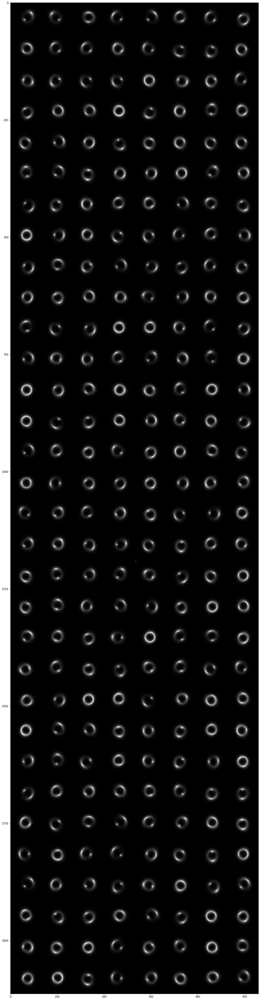

In [15]:
single_batch_grid = utils.make_grid(single_batch, nrow=8)
plt.figure(figsize = (20,70))
plt.imshow(single_batch_grid.permute(1, 2, 0))

In [16]:
class Encoder(nn.Module):

    def __init__(self, in_channels=1, latent_dim = 2048):
        super().__init__()
        
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(in_channels = in_channels, out_channels = 16, kernel_size = 7, stride = 2, padding = 1),
            nn.BatchNorm2d(16),
            nn.PReLU(),

            nn.Conv2d(16, 32, 7, stride=2, padding = 1),
            nn.BatchNorm2d(32),
            nn.PReLU(),
            
            nn.Conv2d(32, 64, 7),
            nn.BatchNorm2d(64),
            nn.PReLU())

        self.flat = nn.Flatten()
        self.enc_lin = nn.Linear(3136, latent_dim)

    def forward(self, x):
        
        x = self.encoder_cnn(x)
        x = self.flat(x)
        x = self.enc_lin(x)

        return x

In [17]:
class Decoder(nn.Module):

    def __init__(self, out_channels = 1, latent_dim = 2048):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dim, 3136),
            nn.PReLU()
        )
     
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 7),
            nn.BatchNorm2d(32),
            nn.PReLU(),
            
            nn.ConvTranspose2d(32, 16, 7, stride = 2, padding = 1, output_padding = 1),
            nn.BatchNorm2d(16),
            nn.PReLU(),

            nn.ConvTranspose2d(16, out_channels, 7, stride = 2, padding = 1, output_padding = 1),
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = x.view(x.shape[0], 64, 7, 7)
        x = self.decoder_conv(x)
#         x = torch.tanh(x)
        return x

In [18]:
class Discriminator(nn.Module):

    def __init__(self, dim_z = 2048 , dim_h = 256):
        super(Discriminator,self).__init__()
        self.dim_z = dim_z
        self.dim_h = dim_h
        self.network = []
        self.network.extend([
            nn.Linear(self.dim_z, self.dim_h),
            nn.PReLU(),
            nn.Linear(self.dim_h, self.dim_h),
            nn.PReLU(),
            nn.Linear(self.dim_h,1),
            nn.Sigmoid(),
        ])
        self.network = nn.Sequential(*self.network)

    def forward(self, z):
        disc = self.network(z)
        return disc

In [19]:
x = torch.randn(config["batch_size"], 1, 64, 64)
encoder = Encoder()
decoder = Decoder()
disc = Discriminator()

encoded = encoder(x)
print(encoded.shape)
print(decoder(encoded).shape)
print(disc(encoded).shape)



del encoder, decoder, disc, x 
gc.collect()

torch.Size([256, 2048])
torch.Size([256, 1, 64, 64])
torch.Size([256, 1])


146

In [20]:
def train_epoch(model, dataloader, ae_criterion, optimizers, example_ct):
    encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
    optim_encoder, optim_decoder, optim_disc, optim_encoder_reg = optimizers["optim_encoder"], optimizers["optim_decoder"], optimizers["optim_disc"], optimizers["optim_encoder_reg"]
    encoder.train()
    decoder.train()
    disc.train()
    
    rec_losses = []
    disc_losses = []
    gen_losses = []
    
    EPS = 1e-12
    
    loop = tqdm(enumerate(dataloader),total = len(dataloader))
    for batch_idx, img_batch in loop:

        X = img_batch.to(device)
        example_ct += len(img_batch)
        
        #update autoencoder weights via reconstruction loss
        encoding = encoder(X)
        fake = decoder(encoding)
        ae_loss = ae_criterion(fake, X)
        rec_losses.append(ae_loss.item())
        
        optim_encoder.zero_grad()
        optim_decoder.zero_grad()
        ae_loss.backward()
        optim_encoder.step()
        optim_decoder.step()
        
        
        #update discriminator weights via cross-entropy loss
        z_real_gauss = (torch.randn(X.shape[0], 2048) * 5.).to(device)
        disc_real_gauss = disc(z_real_gauss)
        z_fake_gauss = encoder(X)
        disc_fake_gauss = disc(z_fake_gauss)
        
        disc_loss = -torch.mean(torch.log(disc_real_gauss + EPS) + torch.log(1- disc_fake_gauss + EPS))
        disc_losses.append(disc_loss.detach().cpu().numpy())
        
        optim_disc.zero_grad()
        disc_loss.backward()
        optim_disc.step()
        
        
        #update generator/encoder via regularization loss
        z_fake_gauss = encoder(X)
        disc_fake_gauss = disc(z_fake_gauss)
        
        gen_loss = -torch.mean(torch.log(disc_fake_gauss + EPS))
        gen_losses.append(gen_loss.detach().cpu().numpy())
        
        optim_encoder_reg.zero_grad()
        gen_loss.backward()
        optim_encoder_reg.step()



    return model, np.mean(rec_losses), np.mean(disc_losses), np.mean(gen_losses), example_ct

In [21]:
def test_epoch(model, dataloader, criterion):
    encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
   
    encoder.eval()
    decoder.eval()
    disc.eval()
    
    test_rec_losses = []

    y_pred_list = []
    y_truth_list = []

    with torch.no_grad():

        loop = tqdm(enumerate(dataloader),total=len(dataloader))
        
        for batch_idx, img_batch in loop:
            X = img_batch.to(device)
            y_truth_list.append(X.detach().cpu().numpy())

            #forward prop
            encoded_space = encoder(X)
            recon = decoder(encoded_space)
            
            y_pred_list.append(recon.detach().cpu().numpy())

            #loss
            loss = criterion(recon, X).item() 

            #batch loss and accuracy
            test_rec_losses.append(loss)


    return y_pred_list, y_truth_list, np.mean(test_rec_losses)

In [22]:
def plot_ae_outputs(model,dataset,epoch, n = 10):
    
    encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
   
    encoder.eval()
    decoder.eval()
    disc.eval()
    
    plt.figure(figsize=(16,4.5))
    random_index = random.randint(0,len(dataset) - (n + 1)) 
    
    
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        img = dataset[random_index + i].unsqueeze(0).to(device)


        with torch.no_grad():
            encoded_space = encoder(img)
            rec_img = decoder(encoded_space)
            
        img = img.permute(0,2,3,1)
        plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Original images')
            
        ax = plt.subplot(2, n, i + 1 + n)
        rec_img = rec_img.permute(0,2,3,1)
        plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
            
    plot_name = f"Reconstructions"
    plt.savefig(plot_name, format="png", dpi=80)  
    pic = Image.open(plot_name)
    
    wandb.log({plot_name: [wandb.Image(pic, caption = f"Epoch : {epoch+1}")]})
            
    plt.show()   

In [23]:
def fit_model(model, config, checkpoint_path):
        
        encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
        # access all HPs through wandb.config, so logging matches execution!
        config = wandb.config

        EPOCHS = config.epochs
        LR = config.learning_rate
        
        #optimizers
        optim_encoder = optim.Adam(encoder.parameters(), lr = LR)
        optim_decoder = optim.Adam(decoder.parameters(), lr = LR)
        optim_disc = optim.Adam(disc.parameters(), lr = LR)
        optim_encoder_reg = optim.Adam(encoder.parameters(), lr = LR * 0.1)
        optimizers = {
            'optim_encoder' : optim_encoder,
            'optim_decoder' : optim_decoder,
            'optim_disc' : optim_disc,
            'optim_encoder_reg' : optim_encoder_reg
        }
        
        ae_criterion = nn.MSELoss()

        loss_dict = {'train_rec_loss' : [],'val_rec_loss' : [], 'disc_loss' : [], 'gen_loss' : []}
        example_ct = 0  # number of examples seen
        min_val_loss = 999 #high value to initlialize

        wandb.watch((model["enc"], model["dec"], model["disc"]), ae_criterion, log="all", log_freq = 10)
        
        for epoch in range(EPOCHS):
            print(f"Epoch {epoch+1}/{EPOCHS}:")
            model, train_rec_loss, disc_loss, gen_loss, example_ct = train_epoch(model, train_loader, ae_criterion, optimizers, example_ct)
            _, _, val_rec_loss  = test_epoch(model, val_loader, ae_criterion)
#             scheduler.step()

            print(f'Train Recon loss: {train_rec_loss}, Val Recon loss: {val_rec_loss}, \n Disc loss: {disc_loss}, Gen loss: {gen_loss}\n')
            
            if val_rec_loss < min_val_loss:
                min_val_loss = val_rec_loss
                print("New lower val loss. Saving model checkpoint!")
                torch.save(encoder.state_dict(), checkpoint_path + 'encoder.pth')
                torch.save(decoder.state_dict(), checkpoint_path + 'decoder.pth')
                torch.save(disc.state_dict(), checkpoint_path + 'discriminator.pth')
    
            wandb.log({"epoch": epoch + 1, 
                       "train_rec_loss":train_rec_loss, "val_rec_loss": val_rec_loss,
                      "disc_loss" : disc_loss, "gen_loss": gen_loss
                      }, step = example_ct)

            loss_dict['train_rec_loss'].append(train_rec_loss)
            loss_dict['val_rec_loss'].append(val_rec_loss)
            
            loss_dict['disc_loss'].append(disc_loss)
            loss_dict['gen_loss'].append(gen_loss)

            if epoch % 5 == 0 or epoch + 1 == EPOCHS:
                plot_ae_outputs(model, val_dataset, epoch,10)


        return model, loss_dict

In [24]:
wandb.init(project="gsoc_model3-AD", config = config)

wandb: Currently logged in as: saranga7. Use `wandb login --relogin` to force relogin


In [25]:
encoder = Encoder().to(device)
decoder = Decoder().to(device)
disc = Discriminator().to(device)

model = {'enc':encoder,
        'dec': decoder,
        'disc': disc}

In [26]:
PATH = "conv_AAE/"

if not os.path.isdir(PATH):
    os.mkdir(PATH)

Epoch 1/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.027409483042092772, Val Recon loss: 0.007248630074577199, 
 Disc loss: 1.4268051385879517, Gen loss: 14.036883354187012

New lower val loss. Saving model checkpoint!


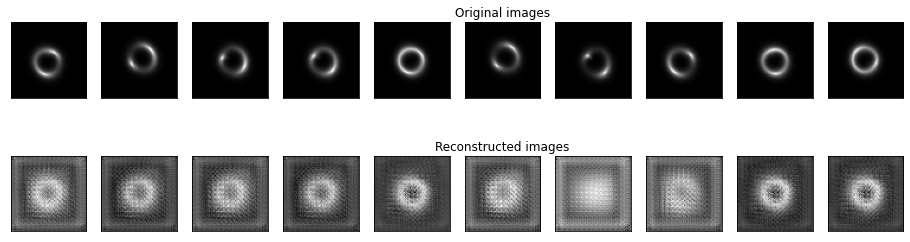

Epoch 2/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.005163379041307153, Val Recon loss: 0.0036707614910685355, 
 Disc loss: 0.4602701961994171, Gen loss: 14.272170066833496

New lower val loss. Saving model checkpoint!
Epoch 3/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.002394057039188546, Val Recon loss: 0.0016914591736470659, 
 Disc loss: 0.3643970787525177, Gen loss: 16.859481811523438

New lower val loss. Saving model checkpoint!
Epoch 4/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0016281141134816299, Val Recon loss: 0.0013413201732974914, 
 Disc loss: 0.22744427621364594, Gen loss: 15.633462905883789

New lower val loss. Saving model checkpoint!
Epoch 5/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0012571002386612903, Val Recon loss: 0.000945258109519879, 
 Disc loss: 0.3749016523361206, Gen loss: 18.430469512939453

New lower val loss. Saving model checkpoint!
Epoch 6/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0010148140269656315, Val Recon loss: 0.0011022156233795816, 
 Disc loss: 0.24573223292827606, Gen loss: 19.845510482788086



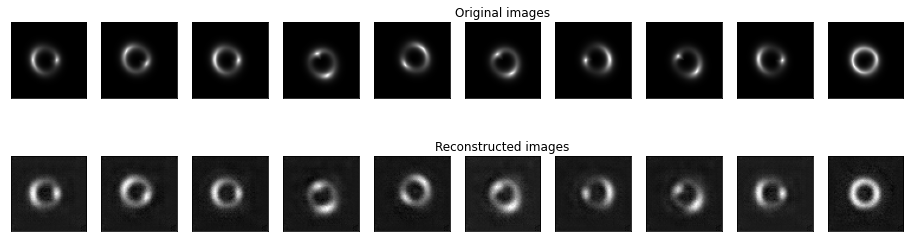

Epoch 7/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0008954409426590855, Val Recon loss: 0.0007564862607978284, 
 Disc loss: 0.255845308303833, Gen loss: 23.621789932250977

New lower val loss. Saving model checkpoint!
Epoch 8/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0007663402293056864, Val Recon loss: 0.0005973474795205726, 
 Disc loss: 0.3005387485027313, Gen loss: 20.751441955566406

New lower val loss. Saving model checkpoint!
Epoch 9/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0007114521245933522, Val Recon loss: 0.0006322411872032615, 
 Disc loss: 0.15964186191558838, Gen loss: 22.363658905029297

Epoch 10/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0006152379808204095, Val Recon loss: 0.0004953377873688522, 
 Disc loss: 0.15114246308803558, Gen loss: 22.07875633239746

New lower val loss. Saving model checkpoint!
Epoch 11/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0005602809494263022, Val Recon loss: 0.000452057028370392, 
 Disc loss: 0.14189153909683228, Gen loss: 20.10318374633789

New lower val loss. Saving model checkpoint!


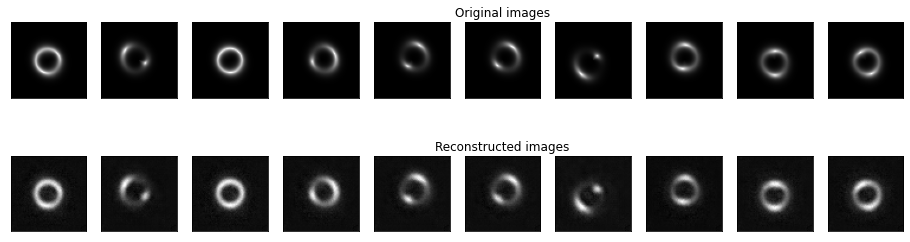

Epoch 12/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0005153783903042829, Val Recon loss: 0.00039563477104012336, 
 Disc loss: 0.12979887425899506, Gen loss: 18.659099578857422

New lower val loss. Saving model checkpoint!
Epoch 13/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00046363525672542326, Val Recon loss: 0.0003785690577286813, 
 Disc loss: 0.13778027892112732, Gen loss: 18.586442947387695

New lower val loss. Saving model checkpoint!
Epoch 14/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0004379668170500786, Val Recon loss: 0.000384292484442186, 
 Disc loss: 0.16066306829452515, Gen loss: 18.606170654296875

Epoch 15/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0004083622455780625, Val Recon loss: 0.00038338968038765923, 
 Disc loss: 0.12469717860221863, Gen loss: 16.863811492919922

Epoch 16/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0003530535045391752, Val Recon loss: 0.00028924055125874776, 
 Disc loss: 0.11719013005495071, Gen loss: 16.623334884643555

New lower val loss. Saving model checkpoint!


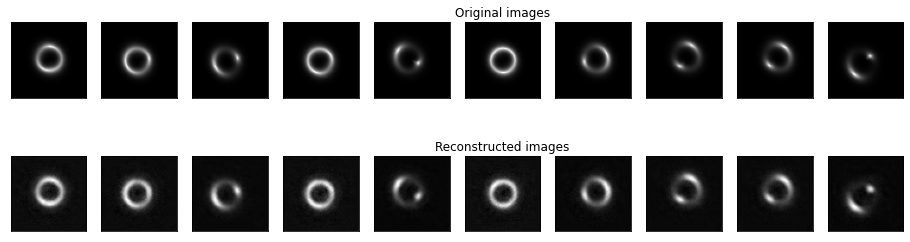

Epoch 17/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0003398540945095651, Val Recon loss: 0.0003207094689261996, 
 Disc loss: 0.10521794110536575, Gen loss: 17.375545501708984

Epoch 18/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00031337557080705913, Val Recon loss: 0.0002391214479252489, 
 Disc loss: 0.09294727444648743, Gen loss: 19.663818359375

New lower val loss. Saving model checkpoint!
Epoch 19/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00027471338345353075, Val Recon loss: 0.00025619337167073455, 
 Disc loss: 0.11394361406564713, Gen loss: 23.19780921936035

Epoch 20/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0002892485749266973, Val Recon loss: 0.00023407005452706167, 
 Disc loss: 0.13873834908008575, Gen loss: 18.524215698242188

New lower val loss. Saving model checkpoint!
Epoch 21/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0002540351112465024, Val Recon loss: 0.0002247062932130777, 
 Disc loss: 0.12082470208406448, Gen loss: 18.122570037841797

New lower val loss. Saving model checkpoint!


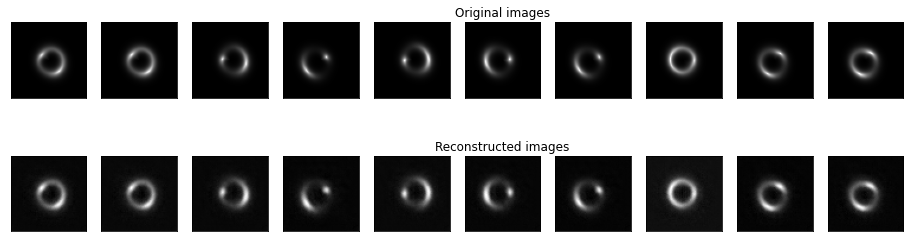

Epoch 22/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0002360802467959429, Val Recon loss: 0.00020631207735277712, 
 Disc loss: 0.11421756446361542, Gen loss: 18.230880737304688

New lower val loss. Saving model checkpoint!
Epoch 23/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00021617580619063913, Val Recon loss: 0.00017935187174265998, 
 Disc loss: 0.11577760428190231, Gen loss: 22.057077407836914

New lower val loss. Saving model checkpoint!
Epoch 24/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00019710314731912498, Val Recon loss: 0.0001608388960853012, 
 Disc loss: 0.11162689328193665, Gen loss: 23.79837417602539

New lower val loss. Saving model checkpoint!
Epoch 25/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00018561314476371973, Val Recon loss: 0.000170191630281301, 
 Disc loss: 0.077755406498909, Gen loss: 25.538368225097656

Epoch 26/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00017453858683872626, Val Recon loss: 0.00013914729707822617, 
 Disc loss: 0.10669241100549698, Gen loss: 25.612749099731445

New lower val loss. Saving model checkpoint!


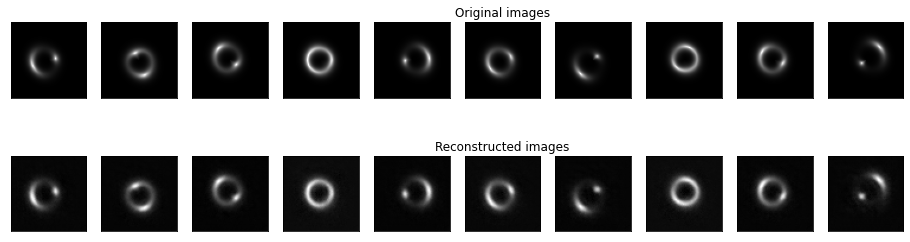

Epoch 27/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00015386719915614283, Val Recon loss: 0.0001322314686452349, 
 Disc loss: 0.04091278091073036, Gen loss: 26.70884132385254

New lower val loss. Saving model checkpoint!
Epoch 28/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00015079412022456015, Val Recon loss: 0.0001385983276931155, 
 Disc loss: 0.07778988778591156, Gen loss: 26.135255813598633

Epoch 29/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00014904980444127198, Val Recon loss: 0.0001492570332225619, 
 Disc loss: 0.13010460138320923, Gen loss: 24.447153091430664

Epoch 30/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00016290834493969285, Val Recon loss: 0.0001338543079327792, 
 Disc loss: 0.13368657231330872, Gen loss: 23.494277954101562

Epoch 31/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00013675715622370378, Val Recon loss: 0.00011061723489547148, 
 Disc loss: 0.08198782056570053, Gen loss: 26.514392852783203

New lower val loss. Saving model checkpoint!


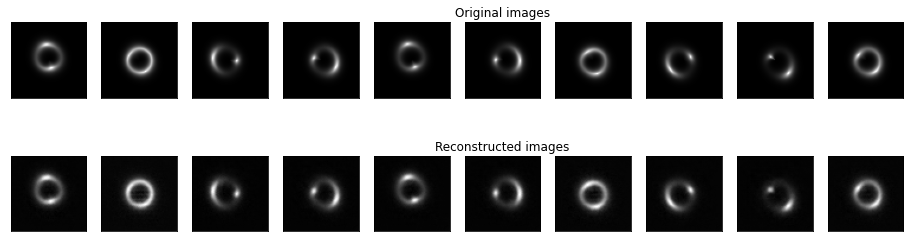

Epoch 32/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0001378894616409692, Val Recon loss: 0.00013505338413071714, 
 Disc loss: 0.04028345271945, Gen loss: 26.96501922607422

Epoch 33/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00013995284498711927, Val Recon loss: 0.00012656316782037416, 
 Disc loss: 0.0964408814907074, Gen loss: 25.67514419555664

Epoch 34/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00013250524332744727, Val Recon loss: 0.00012429910404737003, 
 Disc loss: 0.11446954309940338, Gen loss: 24.858095169067383

Epoch 35/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00012156894949046946, Val Recon loss: 0.00010946917528700497, 
 Disc loss: 0.15555785596370697, Gen loss: 23.59195327758789

New lower val loss. Saving model checkpoint!
Epoch 36/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0001225276482894957, Val Recon loss: 0.00017632118963067315, 
 Disc loss: 0.1181686744093895, Gen loss: 24.669193267822266



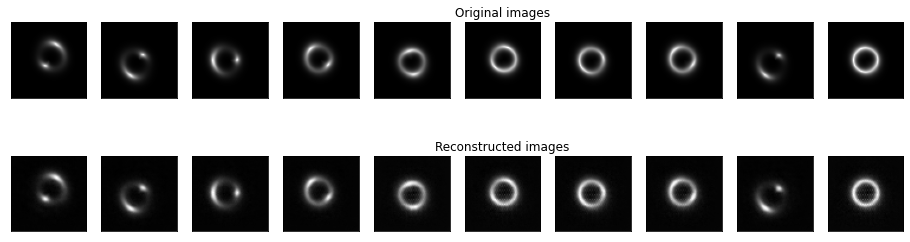

Epoch 37/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00012575144561246857, Val Recon loss: 0.00010163539668105336, 
 Disc loss: 0.13308990001678467, Gen loss: 23.118515014648438

New lower val loss. Saving model checkpoint!
Epoch 38/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00011151626009500475, Val Recon loss: 8.872435056319874e-05, 
 Disc loss: 0.11857113242149353, Gen loss: 24.02968978881836

New lower val loss. Saving model checkpoint!
Epoch 39/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0001175743446273114, Val Recon loss: 0.00011716744079927189, 
 Disc loss: 0.14855055510997772, Gen loss: 21.67134666442871

Epoch 40/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0001272067354608609, Val Recon loss: 8.255319052194763e-05, 
 Disc loss: 0.14502860605716705, Gen loss: 21.92276382446289

New lower val loss. Saving model checkpoint!
Epoch 41/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.705525281713046e-05, Val Recon loss: 9.164757001498301e-05, 
 Disc loss: 0.0900379940867424, Gen loss: 24.29210662841797



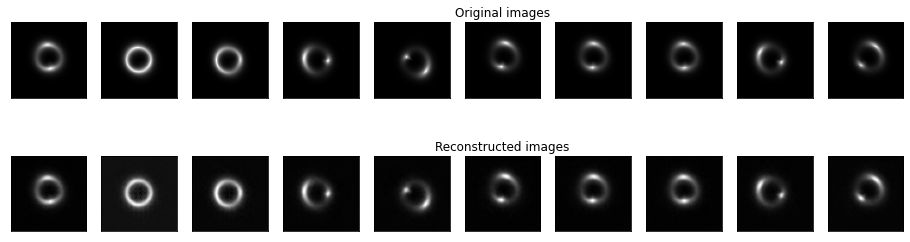

Epoch 42/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0001097988248364829, Val Recon loss: 0.0001298676668536953, 
 Disc loss: 0.12937499582767487, Gen loss: 21.77597999572754

Epoch 43/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.821823554075059e-05, Val Recon loss: 8.698951246009933e-05, 
 Disc loss: 0.10631966590881348, Gen loss: 22.49643325805664

Epoch 44/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00010287631995956746, Val Recon loss: 6.874587496794347e-05, 
 Disc loss: 0.10869015753269196, Gen loss: 23.01621437072754

New lower val loss. Saving model checkpoint!
Epoch 45/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.940467189884223e-05, Val Recon loss: 0.00010128073901998707, 
 Disc loss: 0.09891719371080399, Gen loss: 24.09149742126465

Epoch 46/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.419367843042684e-05, Val Recon loss: 8.667451281022902e-05, 
 Disc loss: 0.13004185259342194, Gen loss: 22.514833450317383



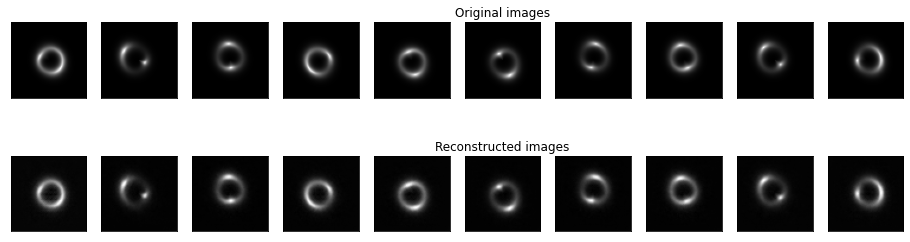

Epoch 47/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.376514136742099e-05, Val Recon loss: 7.355483184154663e-05, 
 Disc loss: 0.03790208697319031, Gen loss: 27.01224708557129

Epoch 48/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.948207295416435e-05, Val Recon loss: 7.792550443102502e-05, 
 Disc loss: 0.09111901372671127, Gen loss: 25.35646629333496

Epoch 49/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.1019612630496e-05, Val Recon loss: 8.786261201344637e-05, 
 Disc loss: 0.07099993526935577, Gen loss: 26.600221633911133

Epoch 50/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.192680652761713e-05, Val Recon loss: 7.023376545273802e-05, 
 Disc loss: 0.058285027742385864, Gen loss: 26.281644821166992

Epoch 51/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.915664957531881e-05, Val Recon loss: 6.175277586508956e-05, 
 Disc loss: 0.06030410900712013, Gen loss: 26.398271560668945

New lower val loss. Saving model checkpoint!


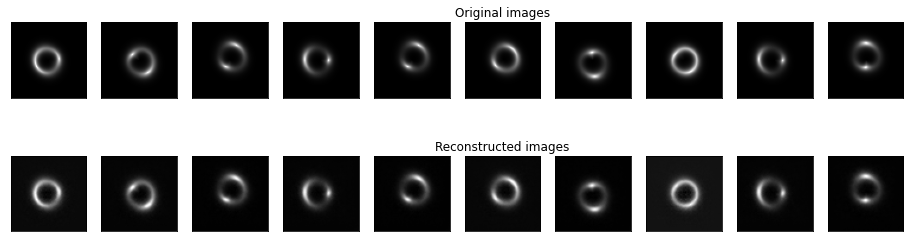

Epoch 52/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.818343764392087e-05, Val Recon loss: 6.383924644776723e-05, 
 Disc loss: 0.06708718836307526, Gen loss: 26.292377471923828

Epoch 53/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.410102735867365e-05, Val Recon loss: 5.605743758173453e-05, 
 Disc loss: 0.09509892761707306, Gen loss: 24.513731002807617

New lower val loss. Saving model checkpoint!
Epoch 54/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.370127199581875e-05, Val Recon loss: 4.9977205587007724e-05, 
 Disc loss: 0.05798409879207611, Gen loss: 26.006542205810547

New lower val loss. Saving model checkpoint!
Epoch 55/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.172699716906575e-05, Val Recon loss: 6.3875687677258e-05, 
 Disc loss: 0.10510672628879547, Gen loss: 24.51133155822754

Epoch 56/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.268927103322888e-05, Val Recon loss: 5.7726656248430823e-05, 
 Disc loss: 0.07730477303266525, Gen loss: 25.038982391357422



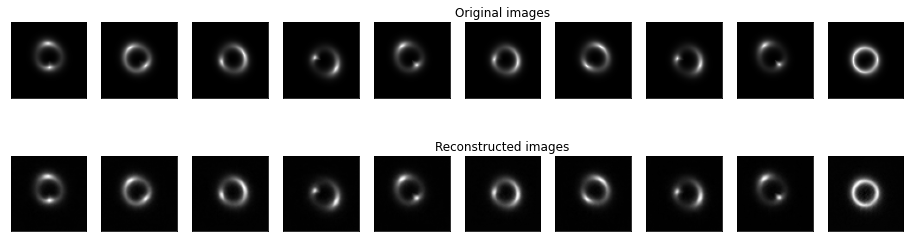

Epoch 57/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.510910946943096e-05, Val Recon loss: 7.037867099926289e-05, 
 Disc loss: 0.07525470852851868, Gen loss: 25.031831741333008

Epoch 58/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.582867497671182e-05, Val Recon loss: 5.1246156443893495e-05, 
 Disc loss: 0.1069229319691658, Gen loss: 24.328372955322266

Epoch 59/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.268282281822277e-05, Val Recon loss: 9.492693546538551e-05, 
 Disc loss: 0.0816216766834259, Gen loss: 24.495132446289062

Epoch 60/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.928667733168076e-05, Val Recon loss: 5.522355422726832e-05, 
 Disc loss: 0.1165313646197319, Gen loss: 22.20340347290039

Epoch 61/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.691294498907172e-05, Val Recon loss: 6.969544968645398e-05, 
 Disc loss: 0.07540914416313171, Gen loss: 22.793434143066406



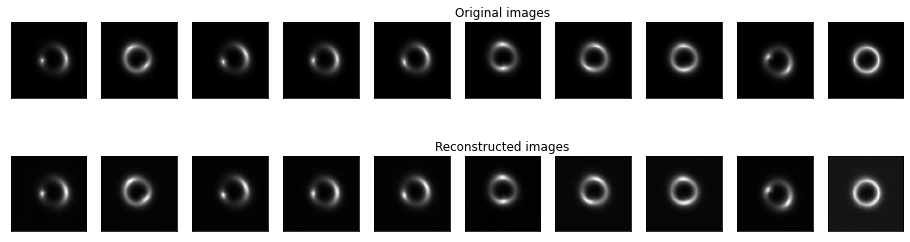

Epoch 62/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.07114042531071e-05, Val Recon loss: 7.377953766586466e-05, 
 Disc loss: 0.07991639524698257, Gen loss: 24.039228439331055

Epoch 63/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.393005188587634e-05, Val Recon loss: 4.467968796638565e-05, 
 Disc loss: 0.07752791792154312, Gen loss: 24.606693267822266

New lower val loss. Saving model checkpoint!
Epoch 64/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.364116157646453e-05, Val Recon loss: 7.02936684117756e-05, 
 Disc loss: 0.04960529878735542, Gen loss: 24.574369430541992

Epoch 65/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.699237443452248e-05, Val Recon loss: 4.4827834547807775e-05, 
 Disc loss: 0.08848603814840317, Gen loss: 23.0440731048584

Epoch 66/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.233464915533935e-05, Val Recon loss: 8.999399061495852e-05, 
 Disc loss: 0.07229997962713242, Gen loss: 22.763839721679688



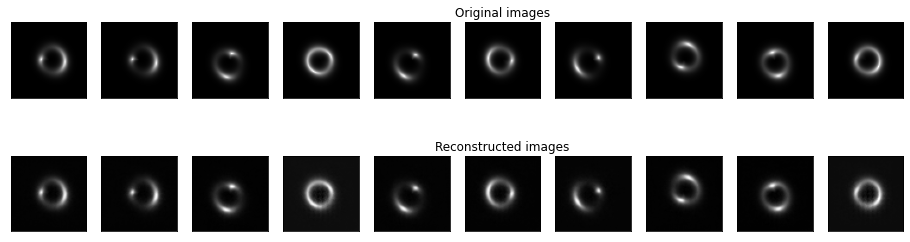

Epoch 67/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.016508836049262e-05, Val Recon loss: 6.883640081569966e-05, 
 Disc loss: 0.08993697911500931, Gen loss: 19.09081268310547

Epoch 68/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.88799211815525e-05, Val Recon loss: 3.8615303815782274e-05, 
 Disc loss: 0.06837521493434906, Gen loss: 21.102527618408203

New lower val loss. Saving model checkpoint!
Epoch 69/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.0012037423919934e-05, Val Recon loss: 8.801579436597724e-05, 
 Disc loss: 0.07384329289197922, Gen loss: 21.228729248046875

Epoch 70/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.316497708500978e-05, Val Recon loss: 5.499648452516542e-05, 
 Disc loss: 0.05212413892149925, Gen loss: 23.836872100830078

Epoch 71/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.9421080174757627e-05, Val Recon loss: 4.690264015355044e-05, 
 Disc loss: 0.07591573148965836, Gen loss: 21.025300979614258



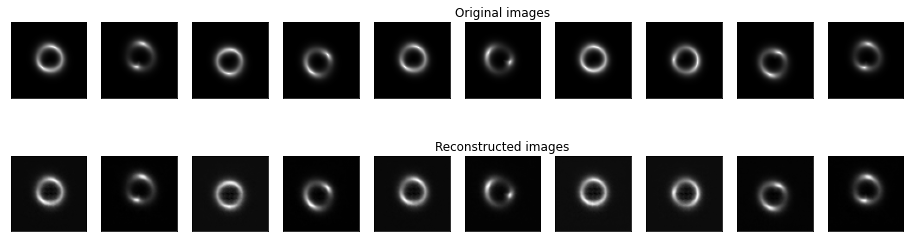

Epoch 72/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.9973626227498294e-05, Val Recon loss: 3.9130836537676965e-05, 
 Disc loss: 0.08479102700948715, Gen loss: 22.130611419677734

Epoch 73/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.75654267391442e-05, Val Recon loss: 3.618985404803728e-05, 
 Disc loss: 0.05407044291496277, Gen loss: 22.220050811767578

New lower val loss. Saving model checkpoint!
Epoch 74/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.9534169268162086e-05, Val Recon loss: 5.639073788188398e-05, 
 Disc loss: 0.08339084684848785, Gen loss: 20.481834411621094

Epoch 75/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.4156596106754767e-05, Val Recon loss: 3.476649928618119e-05, 
 Disc loss: 0.056668058037757874, Gen loss: 22.807086944580078

New lower val loss. Saving model checkpoint!
Epoch 76/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.864683012433196e-05, Val Recon loss: 4.871143917423776e-05, 
 Disc loss: 0.056887201964855194, Gen loss: 23.375896453857422



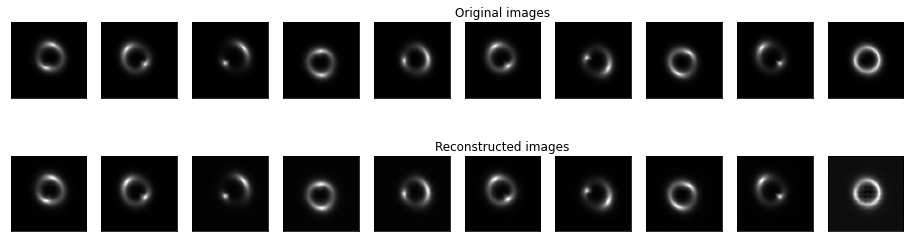

Epoch 77/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.4818732246955206e-05, Val Recon loss: 3.361410361119649e-05, 
 Disc loss: 0.05141044035553932, Gen loss: 23.31329917907715

New lower val loss. Saving model checkpoint!
Epoch 78/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.4022952852591256e-05, Val Recon loss: 3.543362779762699e-05, 
 Disc loss: 0.042648423463106155, Gen loss: 23.710071563720703

Epoch 79/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.4976118185724036e-05, Val Recon loss: 3.739060088668743e-05, 
 Disc loss: 0.0531114861369133, Gen loss: 24.951940536499023

Epoch 80/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.6920367972359246e-05, Val Recon loss: 4.1150940685636466e-05, 
 Disc loss: 0.05476328358054161, Gen loss: 23.8346004486084

Epoch 81/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.884096552322004e-05, Val Recon loss: 2.923596487865628e-05, 
 Disc loss: 0.05653303116559982, Gen loss: 20.38180923461914

New lower val loss. Saving model checkpoint!


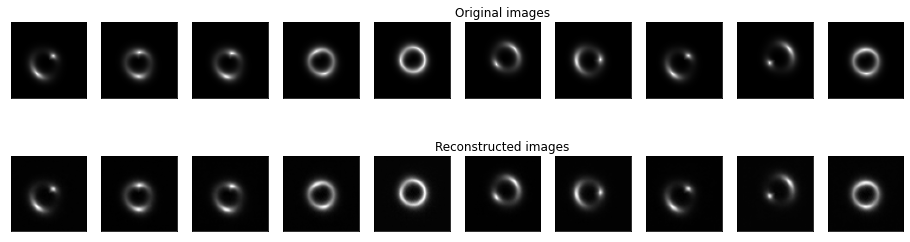

Epoch 82/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.618989333479426e-05, Val Recon loss: 3.641943557239655e-05, 
 Disc loss: 0.054837025701999664, Gen loss: 22.89090919494629

Epoch 83/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.77315770027467e-05, Val Recon loss: 3.3050490957167414e-05, 
 Disc loss: 0.05194545537233353, Gen loss: 22.261964797973633

Epoch 84/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.9700662336171255e-05, Val Recon loss: 4.106555813147376e-05, 
 Disc loss: 0.06525959074497223, Gen loss: 20.021652221679688

Epoch 85/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.29223804898056e-05, Val Recon loss: 3.291985720150276e-05, 
 Disc loss: 0.05653775483369827, Gen loss: 21.040014266967773

Epoch 86/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.085525828603241e-05, Val Recon loss: 3.105784627324384e-05, 
 Disc loss: 0.05730172246694565, Gen loss: 20.797792434692383



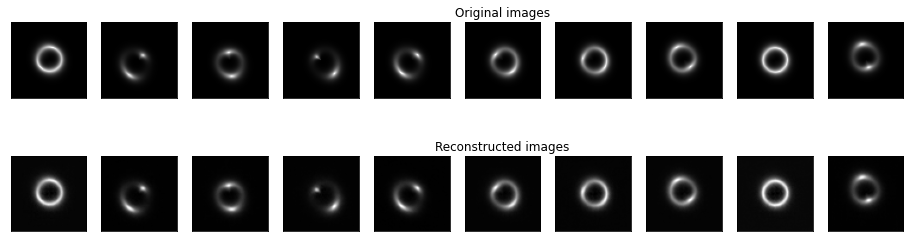

Epoch 87/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.297179841009768e-05, Val Recon loss: 7.182030256242595e-05, 
 Disc loss: 0.05541779100894928, Gen loss: 19.256793975830078

Epoch 88/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.9283744610339794e-05, Val Recon loss: 4.082849853956658e-05, 
 Disc loss: 0.05914397910237312, Gen loss: 18.381681442260742

Epoch 89/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.755925442414666e-05, Val Recon loss: 3.6181778543525273e-05, 
 Disc loss: 0.05378004536032677, Gen loss: 16.97942543029785

Epoch 90/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.605010039683051e-05, Val Recon loss: 2.398855859711249e-05, 
 Disc loss: 0.04428017884492874, Gen loss: 19.241079330444336

New lower val loss. Saving model checkpoint!
Epoch 91/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.632213281539115e-05, Val Recon loss: 3.6709720006911084e-05, 
 Disc loss: 0.05208004638552666, Gen loss: 20.94731903076172



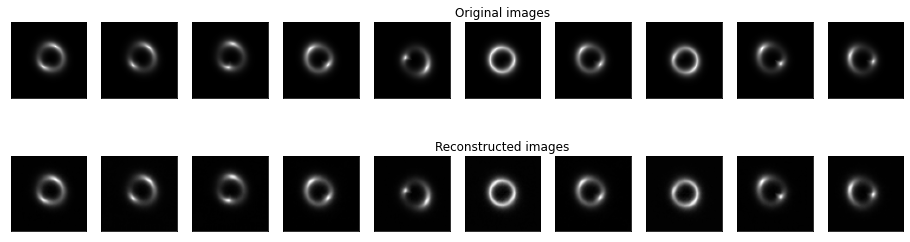

Epoch 92/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.3214247538259575e-05, Val Recon loss: 2.911657732814395e-05, 
 Disc loss: 0.03632565215229988, Gen loss: 20.897411346435547

Epoch 93/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.650082360914109e-05, Val Recon loss: 2.5305627584910122e-05, 
 Disc loss: 0.0508870854973793, Gen loss: 19.676471710205078

Epoch 94/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.0335806578353965e-05, Val Recon loss: 4.211341891075588e-05, 
 Disc loss: 0.05331847071647644, Gen loss: 20.581037521362305

Epoch 95/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.4949168107774615e-05, Val Recon loss: 2.67723395760792e-05, 
 Disc loss: 0.04213802143931389, Gen loss: 23.649091720581055

Epoch 96/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.1728398350816124e-05, Val Recon loss: 2.4567312923156554e-05, 
 Disc loss: 0.03827890381217003, Gen loss: 22.425931930541992



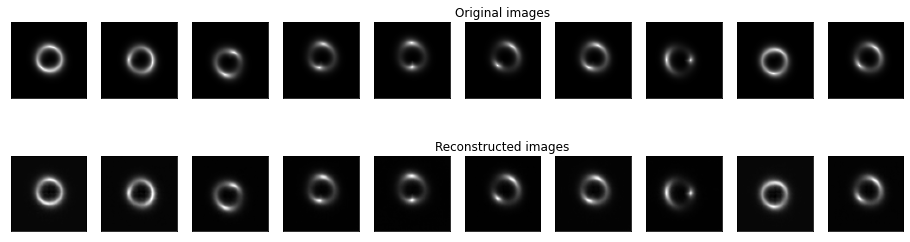

Epoch 97/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.3741662280907464e-05, Val Recon loss: 2.6064481062348932e-05, 
 Disc loss: 0.05437694862484932, Gen loss: 20.81885528564453

Epoch 98/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.660365034585259e-05, Val Recon loss: 2.9983336288650105e-05, 
 Disc loss: 0.047038622200489044, Gen loss: 23.745567321777344

Epoch 99/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.059084970493899e-05, Val Recon loss: 2.135438323117948e-05, 
 Disc loss: 0.016833636909723282, Gen loss: 26.19013023376465

New lower val loss. Saving model checkpoint!
Epoch 100/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.9504487637821328e-05, Val Recon loss: 1.9620932208555234e-05, 
 Disc loss: 0.03110087849199772, Gen loss: 25.517759323120117

New lower val loss. Saving model checkpoint!
Epoch 101/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.8735434671451653e-05, Val Recon loss: 2.657365601205836e-05, 
 Disc loss: 0.033181432634592056, Gen loss: 23.982576370239258



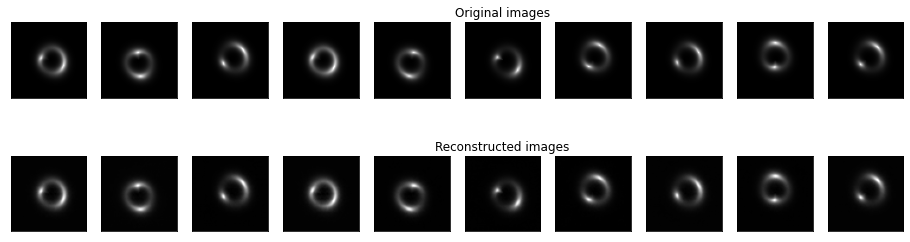

Epoch 102/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.22937836795522e-05, Val Recon loss: 2.3883170595379648e-05, 
 Disc loss: 0.03514944016933441, Gen loss: 24.739042282104492

Epoch 103/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.983186918149015e-05, Val Recon loss: 2.359002812429228e-05, 
 Disc loss: 0.03215412050485611, Gen loss: 23.01761817932129

Epoch 104/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.252533333746657e-05, Val Recon loss: 2.3069274700699476e-05, 
 Disc loss: 0.039629917591810226, Gen loss: 25.302616119384766

Epoch 105/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.8286145640501896e-05, Val Recon loss: 2.6421400333573627e-05, 
 Disc loss: 0.041439831256866455, Gen loss: 22.668123245239258

Epoch 106/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.891124812434876e-05, Val Recon loss: 2.2108693681527962e-05, 
 Disc loss: 0.05584001913666725, Gen loss: 20.833984375



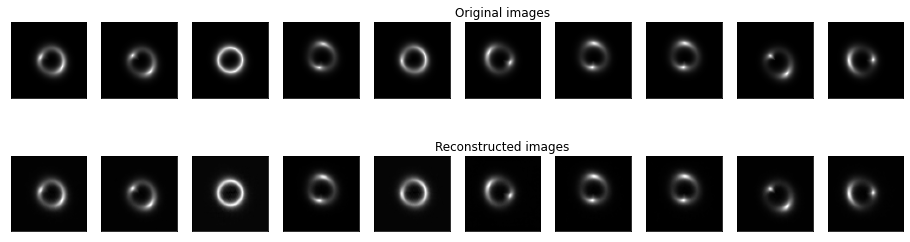

Epoch 107/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.083531936089115e-05, Val Recon loss: 3.0520138655750394e-05, 
 Disc loss: 0.041943926364183426, Gen loss: 22.034757614135742

Epoch 108/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.945425886545467e-05, Val Recon loss: 2.387573375825822e-05, 
 Disc loss: 0.041357364505529404, Gen loss: 23.963481903076172

Epoch 109/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.7047537364398872e-05, Val Recon loss: 2.131022120011039e-05, 
 Disc loss: 0.0323285236954689, Gen loss: 25.060428619384766

Epoch 110/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.83888571300499e-05, Val Recon loss: 2.7490850293866566e-05, 
 Disc loss: 0.04376865550875664, Gen loss: 23.964370727539062

Epoch 111/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.6408875466018932e-05, Val Recon loss: 3.0548164836040494e-05, 
 Disc loss: 0.04568761959671974, Gen loss: 20.68362808227539



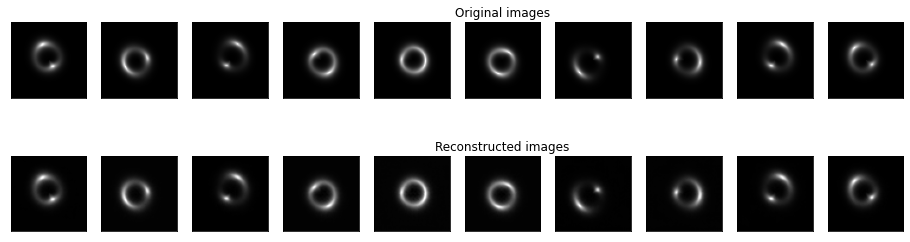

Epoch 112/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.971366711373125e-05, Val Recon loss: 1.846546971743616e-05, 
 Disc loss: 0.04347194358706474, Gen loss: 22.648208618164062

New lower val loss. Saving model checkpoint!
Epoch 113/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.79681876111122e-05, Val Recon loss: 2.4674334579483708e-05, 
 Disc loss: 0.03535636514425278, Gen loss: 24.344465255737305

Epoch 114/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.988940448614495e-05, Val Recon loss: 1.9230393364624535e-05, 
 Disc loss: 0.05513523146510124, Gen loss: 23.436203002929688

Epoch 115/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.4220118825932657e-05, Val Recon loss: 1.7574551748111844e-05, 
 Disc loss: 0.0513179674744606, Gen loss: 20.573049545288086

New lower val loss. Saving model checkpoint!
Epoch 116/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.094430504553127e-05, Val Recon loss: 4.393077324493788e-05, 
 Disc loss: 0.04461172968149185, Gen loss: 20.153013229370117



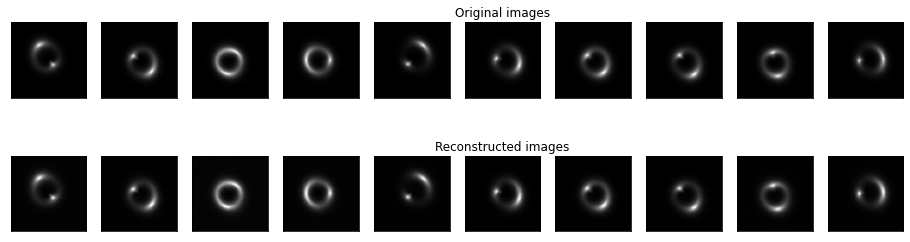

Epoch 117/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.0025188090069295e-05, Val Recon loss: 2.049595827379057e-05, 
 Disc loss: 0.04940986633300781, Gen loss: 20.053659439086914

Epoch 118/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.197760445491941e-05, Val Recon loss: 3.077790905889641e-05, 
 Disc loss: 0.04864504560828209, Gen loss: 19.230913162231445

Epoch 119/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.9611576984288308e-05, Val Recon loss: 2.3982335228033156e-05, 
 Disc loss: 0.03899937495589256, Gen loss: 18.569873809814453

Epoch 120/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.7921778499549296e-05, Val Recon loss: 2.0401300288439314e-05, 
 Disc loss: 0.04919718950986862, Gen loss: 16.575796127319336

Epoch 121/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.6709591344916347e-05, Val Recon loss: 1.9978882038332005e-05, 
 Disc loss: 0.04443969205021858, Gen loss: 17.812213897705078



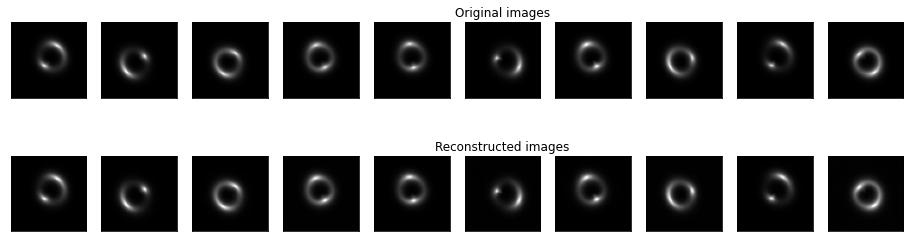

Epoch 122/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.653607260555973e-05, Val Recon loss: 2.531379888953072e-05, 
 Disc loss: 0.04273894801735878, Gen loss: 19.41853904724121

Epoch 123/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.6836107815284744e-05, Val Recon loss: 1.980960102324995e-05, 
 Disc loss: 0.037365108728408813, Gen loss: 15.46597957611084

Epoch 124/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.5894523620548864e-05, Val Recon loss: 2.3604958995646382e-05, 
 Disc loss: 0.03592145815491676, Gen loss: 21.995851516723633

Epoch 125/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.3788429165991674e-05, Val Recon loss: 2.1599072473084863e-05, 
 Disc loss: 0.04466945305466652, Gen loss: 19.537878036499023

Epoch 126/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.3773552571800366e-05, Val Recon loss: 1.9027808876772826e-05, 
 Disc loss: 0.031110962852835655, Gen loss: 19.536561965942383



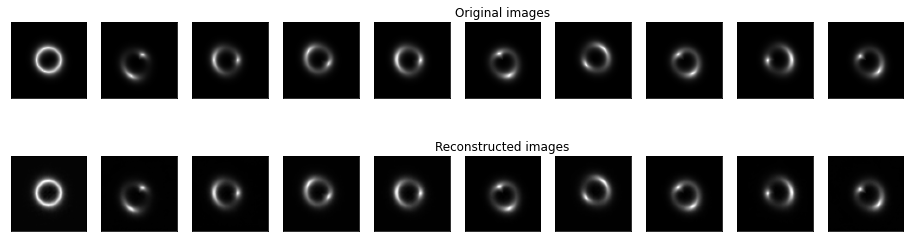

Epoch 127/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.56711930078465e-05, Val Recon loss: 2.2299965065839286e-05, 
 Disc loss: 0.03575189784169197, Gen loss: 17.365032196044922

Epoch 128/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.415514177092193e-05, Val Recon loss: 1.8866349516126018e-05, 
 Disc loss: 0.03881105035543442, Gen loss: 16.74418067932129

Epoch 129/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.3410708759377344e-05, Val Recon loss: 1.88193169176682e-05, 
 Disc loss: 0.04014937952160835, Gen loss: 17.378103256225586

Epoch 130/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.3482895587488728e-05, Val Recon loss: 1.9800608950188485e-05, 
 Disc loss: 0.032738007605075836, Gen loss: 16.269207000732422

Epoch 131/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.2711769473838295e-05, Val Recon loss: 1.788815582888977e-05, 
 Disc loss: 0.039155323058366776, Gen loss: 18.092756271362305



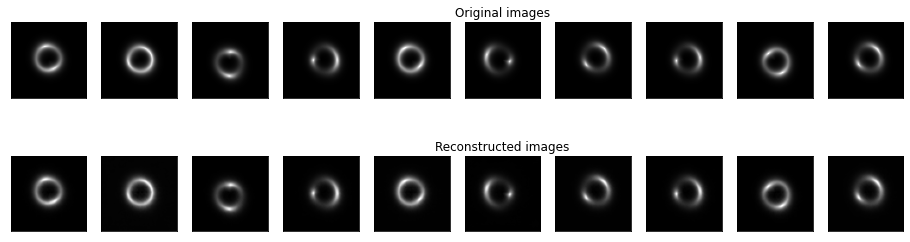

Epoch 132/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.3706616431826068e-05, Val Recon loss: 1.870649794000201e-05, 
 Disc loss: 0.032991304993629456, Gen loss: 17.776681900024414

Epoch 133/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.1873865455603696e-05, Val Recon loss: 1.3314504738243866e-05, 
 Disc loss: 0.027788225561380386, Gen loss: 18.118854522705078

New lower val loss. Saving model checkpoint!
Epoch 134/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.0559791414389695e-05, Val Recon loss: 1.4481558537227102e-05, 
 Disc loss: 0.03256358578801155, Gen loss: 22.14865493774414

Epoch 135/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.171173554240649e-05, Val Recon loss: 2.201637491654967e-05, 
 Disc loss: 0.029949098825454712, Gen loss: 22.603605270385742

Epoch 136/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.045830095068278e-05, Val Recon loss: 1.8618361435882332e-05, 
 Disc loss: 0.02939717471599579, Gen loss: 20.463733673095703



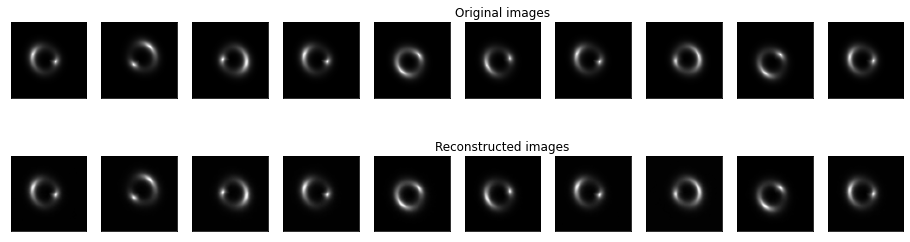

Epoch 137/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.962399780554024e-05, Val Recon loss: 1.455080332056645e-05, 
 Disc loss: 0.028753612190485, Gen loss: 24.616168975830078

Epoch 138/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.2154947646830546e-05, Val Recon loss: 1.619061226342132e-05, 
 Disc loss: 0.02776481769979, Gen loss: 24.436922073364258

Epoch 139/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7389585799711154e-05, Val Recon loss: 1.233410744640019e-05, 
 Disc loss: 0.03075215592980385, Gen loss: 24.28178596496582

New lower val loss. Saving model checkpoint!
Epoch 140/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.2435917386129913e-05, Val Recon loss: 1.526699977855767e-05, 
 Disc loss: 0.03810886666178703, Gen loss: 22.680500030517578

Epoch 141/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.1375404743794372e-05, Val Recon loss: 1.507275768138546e-05, 
 Disc loss: 0.03568233549594879, Gen loss: 21.713916778564453



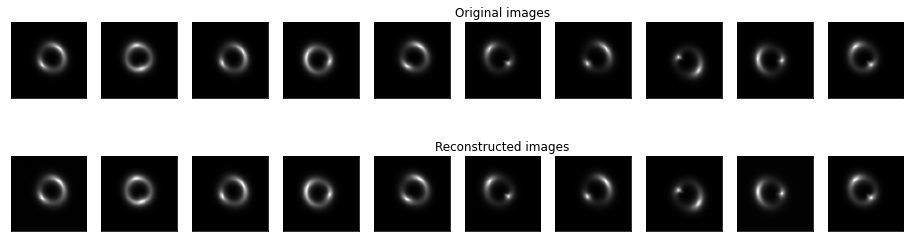

Epoch 142/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.826396175702113e-05, Val Recon loss: 1.4284830083650175e-05, 
 Disc loss: 0.03736257180571556, Gen loss: 23.16232681274414

Epoch 143/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.960641189942664e-05, Val Recon loss: 1.8155883177920867e-05, 
 Disc loss: 0.031806010752916336, Gen loss: 21.287866592407227

Epoch 144/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.9764583633273816e-05, Val Recon loss: 1.3273282092995942e-05, 
 Disc loss: 0.03411480784416199, Gen loss: 23.216249465942383

Epoch 145/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.9225929121469754e-05, Val Recon loss: 1.5299008737201802e-05, 
 Disc loss: 0.028933484107255936, Gen loss: 25.842267990112305

Epoch 146/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.272420641337361e-05, Val Recon loss: 1.603924930451386e-05, 
 Disc loss: 0.006766642909497023, Gen loss: 26.774293899536133



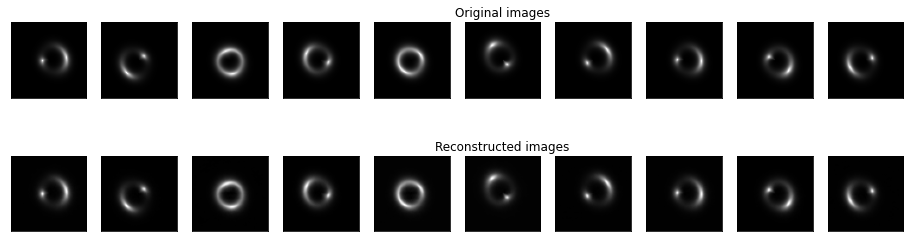

Epoch 147/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7023907142366632e-05, Val Recon loss: 1.7297525321029956e-05, 
 Disc loss: 0.021093357354402542, Gen loss: 25.824954986572266

Epoch 148/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.1598539548128237e-05, Val Recon loss: 2.2814691975428206e-05, 
 Disc loss: 0.01841205544769764, Gen loss: 26.28163719177246

Epoch 149/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.754673629616806e-05, Val Recon loss: 1.2223210938423614e-05, 
 Disc loss: 0.024266380816698074, Gen loss: 25.24605369567871

New lower val loss. Saving model checkpoint!
Epoch 150/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.004832216648496e-05, Val Recon loss: 1.3021535677479631e-05, 
 Disc loss: 0.015258611179888248, Gen loss: 26.339750289916992

Epoch 151/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.891357497288899e-05, Val Recon loss: 1.6965804914232445e-05, 
 Disc loss: 0.022776378318667412, Gen loss: 25.611156463623047



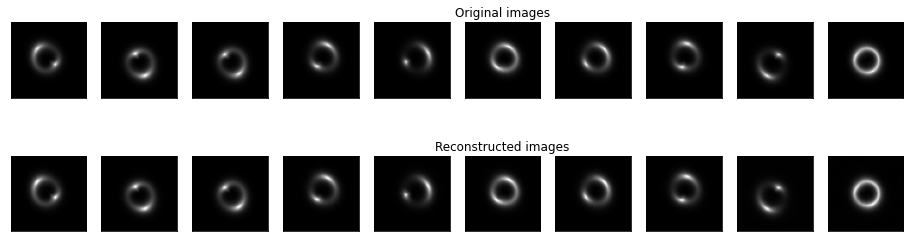

Epoch 152/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.81827039541698e-05, Val Recon loss: 1.4243179672727516e-05, 
 Disc loss: 0.03063160367310047, Gen loss: 24.835285186767578

Epoch 153/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.1763077636415978e-05, Val Recon loss: 1.5333927068341938e-05, 
 Disc loss: 0.03149782121181488, Gen loss: 20.813467025756836

Epoch 154/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7449041145507657e-05, Val Recon loss: 1.2621129523419464e-05, 
 Disc loss: 0.04540727660059929, Gen loss: 24.21600914001465

Epoch 155/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.895562130511939e-05, Val Recon loss: 1.1190598646256452e-05, 
 Disc loss: 0.014415634796023369, Gen loss: 25.470109939575195

New lower val loss. Saving model checkpoint!
Epoch 156/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5782239376150774e-05, Val Recon loss: 2.384812837085014e-05, 
 Disc loss: 0.03957592323422432, Gen loss: 23.419923782348633



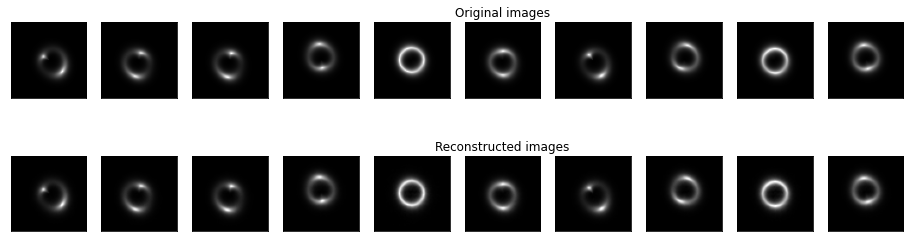

Epoch 157/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7488425261586148e-05, Val Recon loss: 1.3896839643873844e-05, 
 Disc loss: 0.037232935428619385, Gen loss: 23.96296501159668

Epoch 158/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.790534417456552e-05, Val Recon loss: 1.3975510834522234e-05, 
 Disc loss: 0.030748503282666206, Gen loss: 24.67954444885254

Epoch 159/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8450494155681846e-05, Val Recon loss: 1.2192574912559292e-05, 
 Disc loss: 0.032117314636707306, Gen loss: 22.950593948364258

Epoch 160/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6723482026422177e-05, Val Recon loss: 1.3382705623775513e-05, 
 Disc loss: 0.03505877032876015, Gen loss: 24.423171997070312

Epoch 161/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4362951983999964e-05, Val Recon loss: 1.4456588360189926e-05, 
 Disc loss: 0.02178807370364666, Gen loss: 25.854290008544922



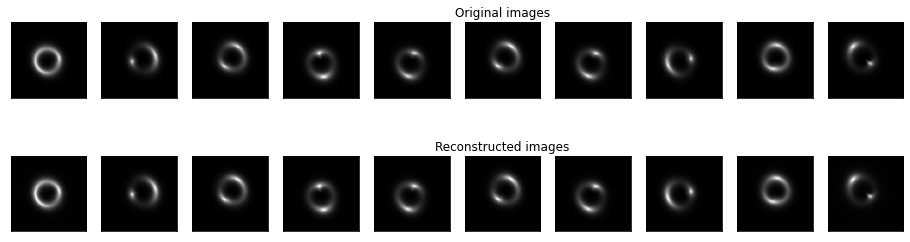

Epoch 162/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4829057864025086e-05, Val Recon loss: 9.150318469942755e-06, 
 Disc loss: 0.01955258473753929, Gen loss: 25.649547576904297

New lower val loss. Saving model checkpoint!
Epoch 163/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8896414977303436e-05, Val Recon loss: 1.1322952559567057e-05, 
 Disc loss: 0.032847847789525986, Gen loss: 24.424715042114258

Epoch 164/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.624434113482744e-05, Val Recon loss: 1.1624392552928637e-05, 
 Disc loss: 0.029118316248059273, Gen loss: 24.9786434173584

Epoch 165/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.746721803960967e-05, Val Recon loss: 1.1292606662512602e-05, 
 Disc loss: 0.03178960457444191, Gen loss: 26.02542495727539

Epoch 166/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4851928451683249e-05, Val Recon loss: 9.617369970429638e-06, 
 Disc loss: 0.01910535804927349, Gen loss: 26.522104263305664



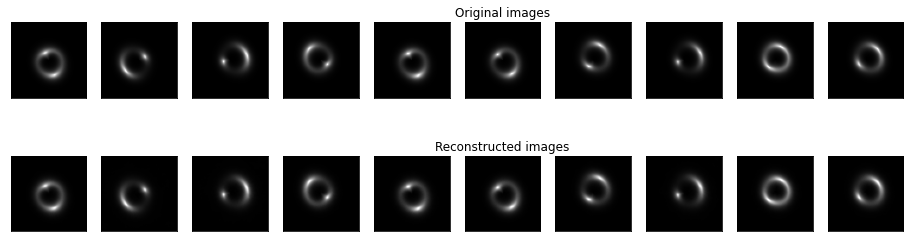

Epoch 167/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.724060435963361e-05, Val Recon loss: 1.108881497202674e-05, 
 Disc loss: 0.02016032487154007, Gen loss: 25.534290313720703

Epoch 168/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4648726942600285e-05, Val Recon loss: 1.0311857598329274e-05, 
 Disc loss: 0.01794462651014328, Gen loss: 26.667940139770508

Epoch 169/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.58917942626264e-05, Val Recon loss: 1.8278903654491944e-05, 
 Disc loss: 0.014564440585672855, Gen loss: 26.758495330810547

Epoch 170/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6844717628448568e-05, Val Recon loss: 1.7510303425499136e-05, 
 Disc loss: 0.021033944562077522, Gen loss: 26.446765899658203

Epoch 171/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5221825579086259e-05, Val Recon loss: 9.37947930247497e-06, 
 Disc loss: 0.010176386684179306, Gen loss: 27.34720802307129



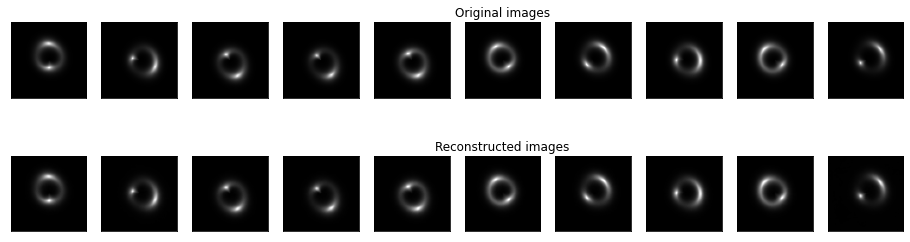

Epoch 172/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4133598079927343e-05, Val Recon loss: 1.463552851216971e-05, 
 Disc loss: 0.011160592548549175, Gen loss: 27.053937911987305

Epoch 173/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4249305647996537e-05, Val Recon loss: 1.169161280106184e-05, 
 Disc loss: 0.01735386997461319, Gen loss: 26.918054580688477

Epoch 174/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6200469413354626e-05, Val Recon loss: 1.0361403838032857e-05, 
 Disc loss: 0.011034228838980198, Gen loss: 26.964942932128906

Epoch 175/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.574056408438274e-05, Val Recon loss: 1.2712149125743761e-05, 
 Disc loss: 0.021716631948947906, Gen loss: 26.786466598510742

Epoch 176/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.467745557728858e-05, Val Recon loss: 1.1568677109607961e-05, 
 Disc loss: 0.004121808800846338, Gen loss: 27.418909072875977



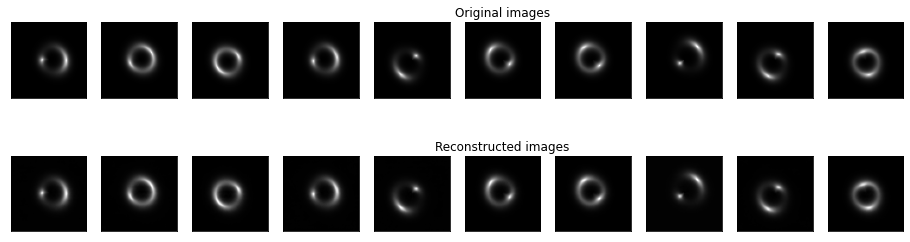

Epoch 177/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2017413801922134e-05, Val Recon loss: 7.151799865015265e-06, 
 Disc loss: 0.0026068859733641148, Gen loss: 27.383533477783203

New lower val loss. Saving model checkpoint!
Epoch 178/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3414586221288201e-05, Val Recon loss: 9.174089023468292e-06, 
 Disc loss: 0.014538085088133812, Gen loss: 27.069978713989258

Epoch 179/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4258896211218815e-05, Val Recon loss: 1.0437383429638834e-05, 
 Disc loss: 0.010005421936511993, Gen loss: 26.93543243408203

Epoch 180/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6547053129307566e-05, Val Recon loss: 1.0132183585180124e-05, 
 Disc loss: 0.014230313710868359, Gen loss: 27.283952713012695

Epoch 181/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.277860855884474e-05, Val Recon loss: 8.60011196992774e-06, 
 Disc loss: 0.006207553204149008, Gen loss: 27.453460693359375



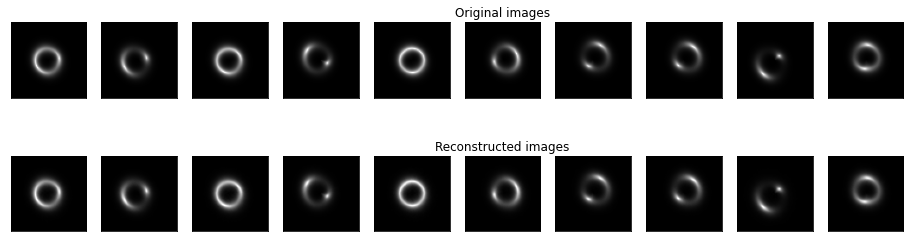

Epoch 182/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5639922779999725e-05, Val Recon loss: 8.393745600996124e-06, 
 Disc loss: 0.015227477066218853, Gen loss: 27.3055362701416

Epoch 183/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1805850840782439e-05, Val Recon loss: 6.791934235176693e-06, 
 Disc loss: 0.0020115396473556757, Gen loss: 27.458370208740234

New lower val loss. Saving model checkpoint!
Epoch 184/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3707919790099243e-05, Val Recon loss: 6.335803239683931e-06, 
 Disc loss: 0.0029440762009471655, Gen loss: 27.54104995727539

New lower val loss. Saving model checkpoint!
Epoch 185/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0836499572545718e-05, Val Recon loss: 8.464205469257044e-06, 
 Disc loss: 0.008107616566121578, Gen loss: 27.40374183654785

Epoch 186/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.207179007872858e-05, Val Recon loss: 6.448894509958336e-06, 
 Disc loss: 0.009551038034260273, Gen loss: 27.400297164916992



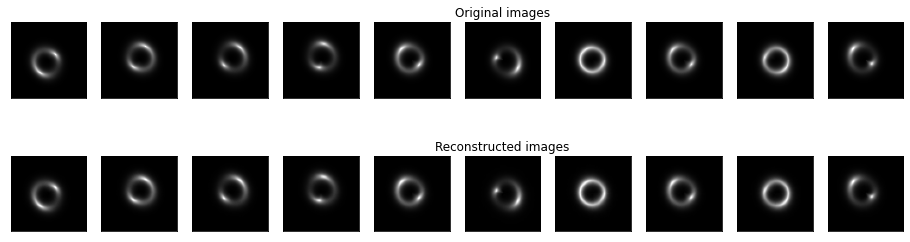

Epoch 187/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3538575906775371e-05, Val Recon loss: 1.0345754263754417e-05, 
 Disc loss: 0.011160159483551979, Gen loss: 27.3595027923584

Epoch 188/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4616444277969069e-05, Val Recon loss: 7.106647697380848e-06, 
 Disc loss: 0.005505155306309462, Gen loss: 27.48004150390625

Epoch 189/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1532251654890229e-05, Val Recon loss: 9.65248040706178e-06, 
 Disc loss: 0.004559213295578957, Gen loss: 27.499509811401367

Epoch 190/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.23703135997874e-05, Val Recon loss: 7.093874905371598e-06, 
 Disc loss: 0.008800506591796875, Gen loss: 27.519882202148438

Epoch 191/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.358932274067454e-05, Val Recon loss: 1.0905948733529334e-05, 
 Disc loss: 0.008521748706698418, Gen loss: 27.44829750061035



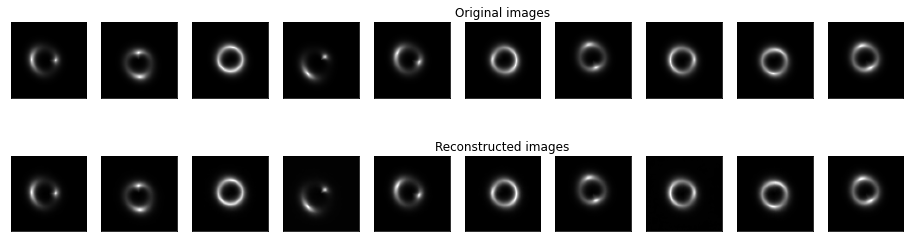

Epoch 192/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2585633032709049e-05, Val Recon loss: 7.399655563252357e-06, 
 Disc loss: 0.0059590726159513, Gen loss: 27.51025390625

Epoch 193/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1476486754897927e-05, Val Recon loss: 9.477207842994378e-06, 
 Disc loss: 0.004814282059669495, Gen loss: 27.570701599121094

Epoch 194/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0441086487844586e-05, Val Recon loss: 6.908589158330061e-06, 
 Disc loss: 0.0033567536156624556, Gen loss: 27.543563842773438

Epoch 195/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1608824133205467e-05, Val Recon loss: 6.325094192207972e-06, 
 Disc loss: 0.001220362144522369, Gen loss: 27.6168270111084

New lower val loss. Saving model checkpoint!
Epoch 196/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0722788053307331e-05, Val Recon loss: 7.806427776005068e-06, 
 Disc loss: 0.0003420414577703923, Gen loss: 27.62005615234375



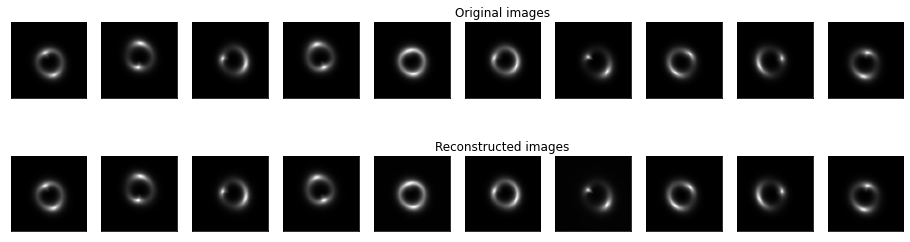

Epoch 197/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1428357888981828e-05, Val Recon loss: 6.454864938455608e-06, 
 Disc loss: 4.9157995817949995e-05, Gen loss: 27.623680114746094

Epoch 198/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1207657597536903e-05, Val Recon loss: 1.0462450417334265e-05, 
 Disc loss: 0.0009649100829847157, Gen loss: 27.606273651123047

Epoch 199/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.072410722948032e-05, Val Recon loss: 9.492157611627286e-06, 
 Disc loss: 0.00020380444766487926, Gen loss: 27.607168197631836

Epoch 200/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0449192296794227e-05, Val Recon loss: 7.371156344662369e-06, 
 Disc loss: 0.0007706653559580445, Gen loss: 27.51856231689453

Epoch 201/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1190756052810433e-05, Val Recon loss: 6.549929771103456e-06, 
 Disc loss: 0.01932843029499054, Gen loss: 27.335371017456055



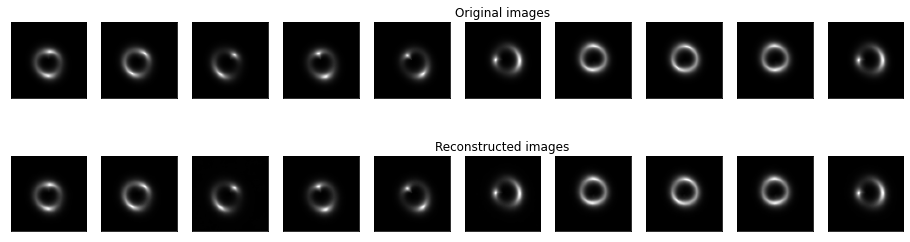

Epoch 202/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.956653413459992e-06, Val Recon loss: 6.3914591616291245e-06, 
 Disc loss: 0.00811084732413292, Gen loss: 27.567771911621094

Epoch 203/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.043291340131898e-05, Val Recon loss: 8.673096999700647e-06, 
 Disc loss: 0.007220992352813482, Gen loss: 27.54542350769043

Epoch 204/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1435329090775025e-05, Val Recon loss: 1.1973642661663083e-05, 
 Disc loss: 0.0021802661940455437, Gen loss: 27.631023406982422

Epoch 205/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2057435294390826e-05, Val Recon loss: 6.812364719937452e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 206/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0927496348963484e-05, Val Recon loss: 5.003939451045072e-06, 
 Disc loss: 0.0, Gen loss: 27.63075828552246

New lower val loss. Saving model checkpoint!


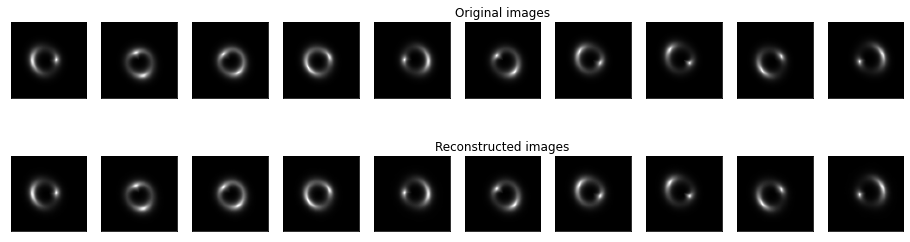

Epoch 207/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0799856001807327e-05, Val Recon loss: 1.020297733905156e-05, 
 Disc loss: 0.0, Gen loss: 27.63083839416504

Epoch 208/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.470809266389584e-06, Val Recon loss: 6.047401206564649e-06, 
 Disc loss: 2.050624392513356e-10, Gen loss: 27.630373001098633

Epoch 209/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0795308182022957e-05, Val Recon loss: 7.049385102517489e-06, 
 Disc loss: 9.215698781872561e-08, Gen loss: 27.62995147705078

Epoch 210/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1634634675003093e-05, Val Recon loss: 9.036831114725726e-06, 
 Disc loss: 0.0005216487916186452, Gen loss: 27.62984275817871

Epoch 211/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0191902215786143e-05, Val Recon loss: 5.952155586581082e-06, 
 Disc loss: 9.530768693366554e-06, Gen loss: 27.631025314331055



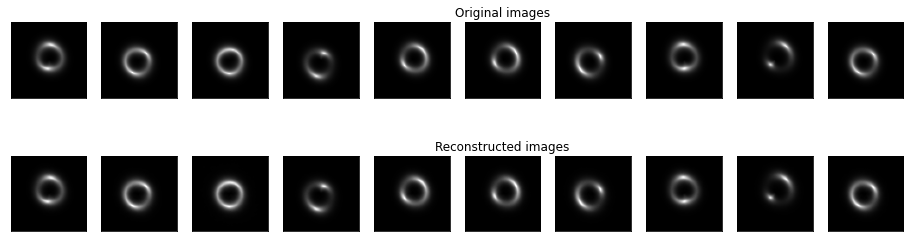

Epoch 212/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0198681489165302e-05, Val Recon loss: 5.413185994661439e-06, 
 Disc loss: 3.0123936085146852e-05, Gen loss: 27.631025314331055

Epoch 213/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.766639109685164e-06, Val Recon loss: 6.743365045420231e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 214/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.225240486090332e-06, Val Recon loss: 8.493116891056869e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 215/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0066783905781992e-05, Val Recon loss: 7.365606658519634e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 216/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.345042194623485e-06, Val Recon loss: 4.890599484497216e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

New lower val loss. Saving model checkpoint!


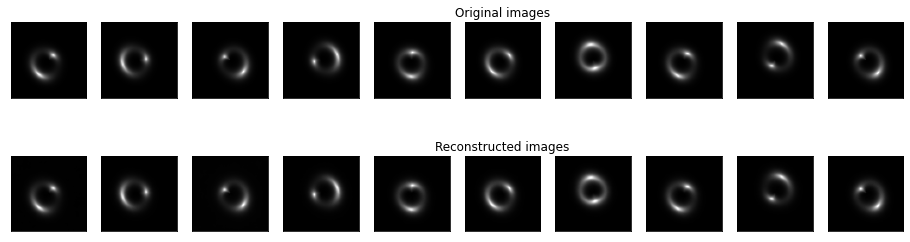

Epoch 217/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.409012568331166e-06, Val Recon loss: 5.486787257622281e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 218/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.876634091468595e-06, Val Recon loss: 5.877909896096551e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 219/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.90934723973757e-06, Val Recon loss: 6.145953294536513e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 220/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.153754836674074e-06, Val Recon loss: 6.09177984895521e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 221/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0165243774606822e-05, Val Recon loss: 5.116209144438875e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



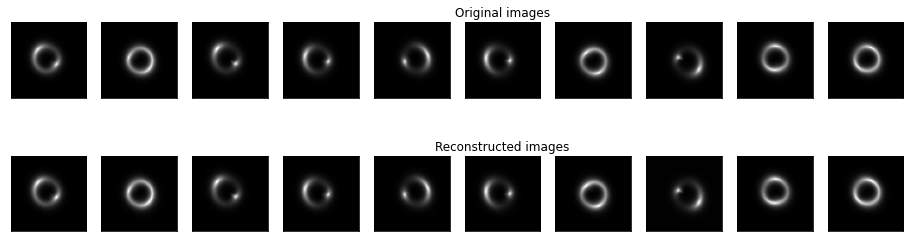

Epoch 222/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0604357232813352e-05, Val Recon loss: 9.711261554912198e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 223/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0529943481892712e-05, Val Recon loss: 6.38347147388332e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 224/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.782462606978455e-06, Val Recon loss: 6.76571956622259e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 225/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.77081976539387e-06, Val Recon loss: 1.100367343396e-05, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 226/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0261651281025228e-05, Val Recon loss: 5.849174865741386e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



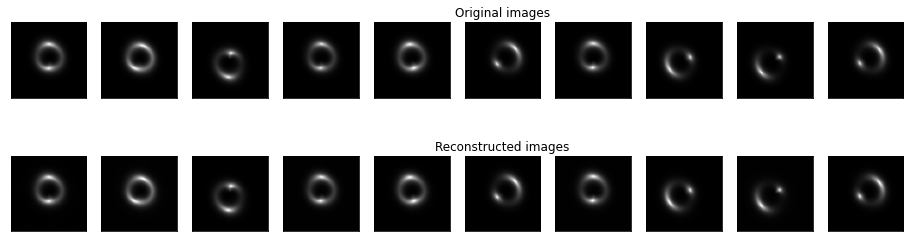

Epoch 227/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.22572874706938e-06, Val Recon loss: 4.822654823834051e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

New lower val loss. Saving model checkpoint!
Epoch 228/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.44724533026488e-06, Val Recon loss: 5.287783652521385e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 229/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.86535635716661e-06, Val Recon loss: 6.416360469706382e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 230/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.063504162983308e-06, Val Recon loss: 5.081869656148936e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 231/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.060533443955521e-06, Val Recon loss: 4.90287250916784e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



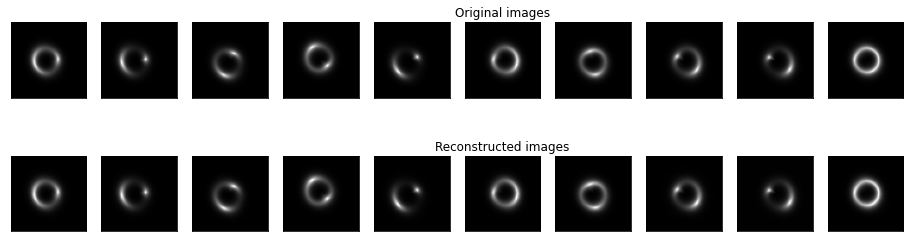

Epoch 232/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.286322904788086e-06, Val Recon loss: 4.89932067972e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 233/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.812728392012597e-06, Val Recon loss: 5.5916193054549185e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 234/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.464727499746555e-06, Val Recon loss: 6.320777730353358e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 235/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.402540073585868e-06, Val Recon loss: 5.663150204782141e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 236/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.327021403418407e-06, Val Recon loss: 5.4495597194343445e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



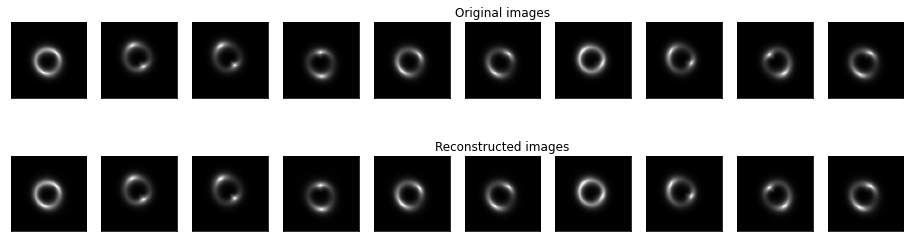

Epoch 237/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.66534986542303e-06, Val Recon loss: 1.521106959343241e-05, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 238/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.848185014361495e-06, Val Recon loss: 3.8072940292800517e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

New lower val loss. Saving model checkpoint!
Epoch 239/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.548860994908839e-06, Val Recon loss: 5.123361360246135e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 240/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.536387358513904e-06, Val Recon loss: 4.238328478499574e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 241/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.321876433610418e-06, Val Recon loss: 6.428035804775492e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



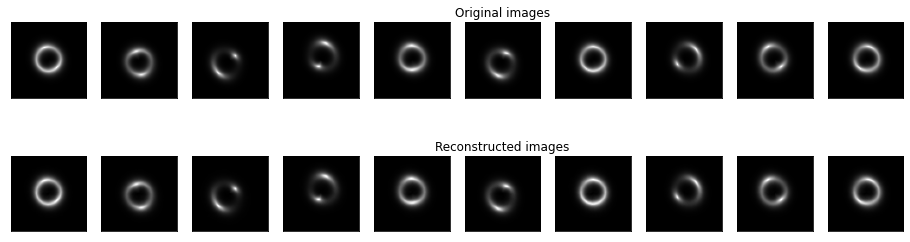

Epoch 242/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.88301189325658e-06, Val Recon loss: 4.171203525200124e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 243/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.666681140982984e-06, Val Recon loss: 8.342938599525951e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 244/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.5831728471238e-06, Val Recon loss: 3.4819016339800632e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

New lower val loss. Saving model checkpoint!
Epoch 245/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.984046908717606e-06, Val Recon loss: 4.416861328435415e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 246/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.895556750970331e-06, Val Recon loss: 7.23730944527132e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



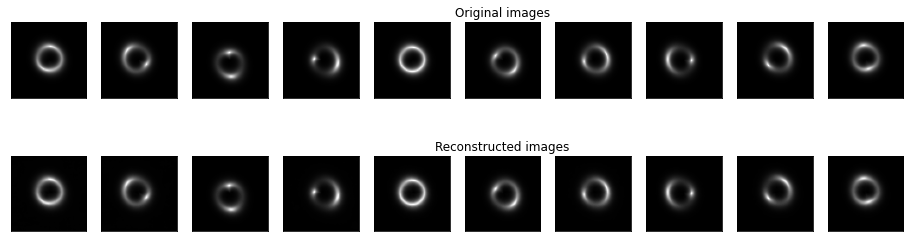

Epoch 247/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.152804359266323e-06, Val Recon loss: 3.7784265916545537e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 248/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.428937297269815e-06, Val Recon loss: 6.150674279423482e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 249/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.008075149627317e-06, Val Recon loss: 5.391490604880447e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 250/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.505408925973007e-06, Val Recon loss: 3.916451179166971e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 251/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.167464116972993e-06, Val Recon loss: 4.511727082798542e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



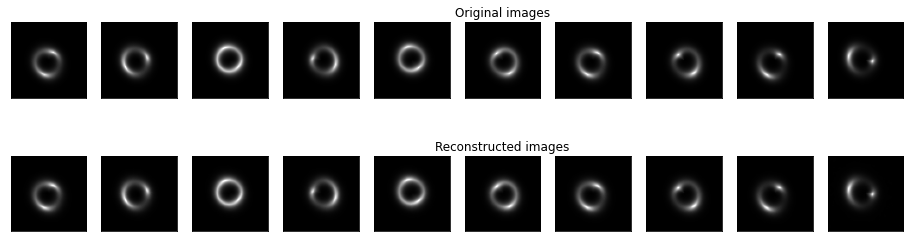

Epoch 252/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.930371635382538e-06, Val Recon loss: 5.906766091356985e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 253/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.956609059782825e-06, Val Recon loss: 4.984851633101546e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 254/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.659396684412692e-06, Val Recon loss: 5.127828343473892e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 255/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.358377379956154e-06, Val Recon loss: 4.4319635384858375e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 256/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.708107292574164e-06, Val Recon loss: 4.654468638262996e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



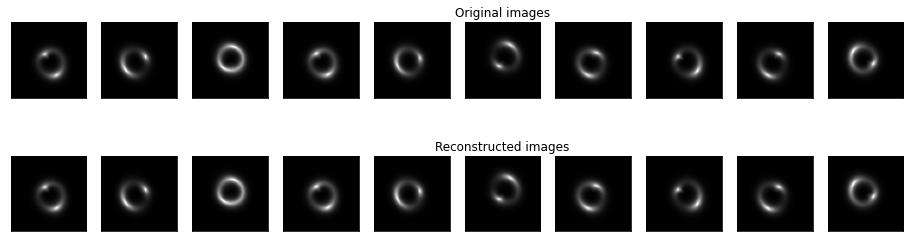

Epoch 257/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.91292738932673e-06, Val Recon loss: 4.2417697032861825e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 258/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.37419753131022e-06, Val Recon loss: 3.5216600180218747e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 259/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.464127329199248e-06, Val Recon loss: 8.353307647565896e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 260/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.049890866542904e-06, Val Recon loss: 3.992465179989166e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 261/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.737400147737081e-06, Val Recon loss: 5.385210442909738e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



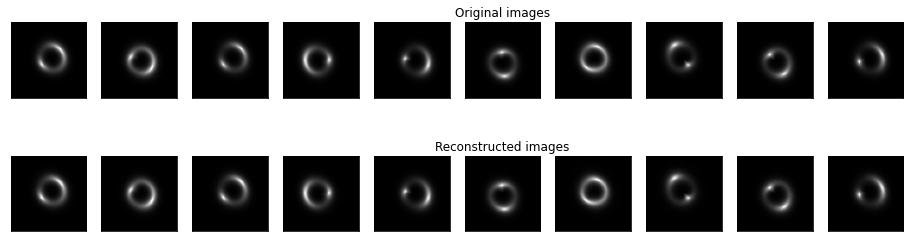

Epoch 262/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.579175513005418e-06, Val Recon loss: 4.921037644736417e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 263/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.530169043110025e-06, Val Recon loss: 5.4637783553819945e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 264/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.81759437997457e-06, Val Recon loss: 3.965287608783304e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 265/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.229386291924304e-06, Val Recon loss: 6.793007034704917e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 266/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.539827218876272e-06, Val Recon loss: 4.02319857231406e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



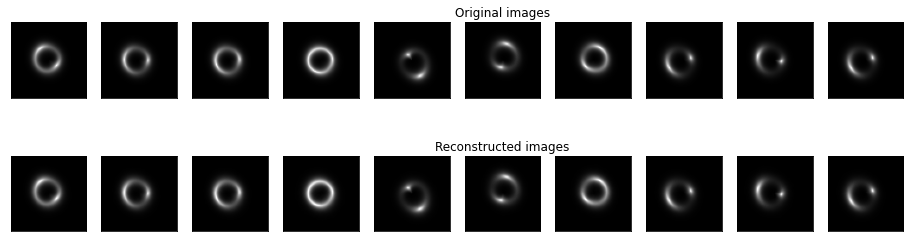

Epoch 267/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.279039666440056e-06, Val Recon loss: 3.727866012721077e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 268/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.707445108903136e-06, Val Recon loss: 3.2855156304220954e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

New lower val loss. Saving model checkpoint!
Epoch 269/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.429734135616395e-06, Val Recon loss: 6.011451862125088e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 270/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.158516424052832e-06, Val Recon loss: 4.06284284003454e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 271/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.250207299896069e-06, Val Recon loss: 4.32412707596086e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



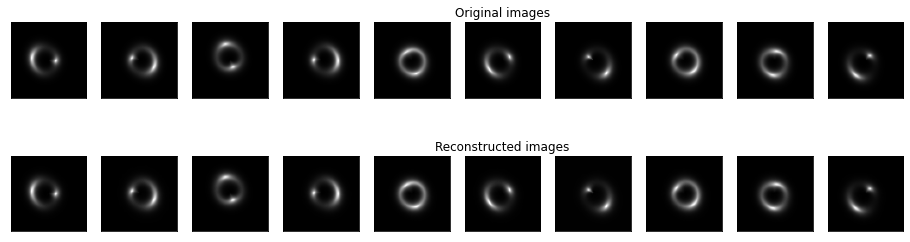

Epoch 272/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.244676854526314e-06, Val Recon loss: 5.481629260531109e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 273/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.037429816449764e-06, Val Recon loss: 3.710901940697416e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 274/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.429511547218121e-06, Val Recon loss: 6.465665440676578e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 275/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.3598437899709765e-06, Val Recon loss: 4.582164112636949e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 276/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.64379421041567e-06, Val Recon loss: 4.118561163421772e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



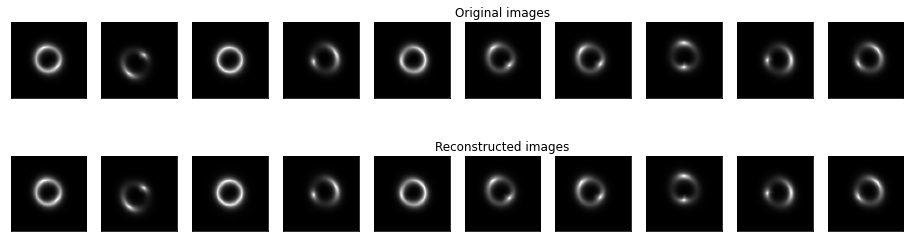

Epoch 277/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.638489186228147e-06, Val Recon loss: 3.7908417248723304e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 278/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.9323509205370356e-06, Val Recon loss: 4.445845711921316e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 279/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.451014829975758e-06, Val Recon loss: 4.043568626204635e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 280/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.496036565779023e-06, Val Recon loss: 3.1862202326414667e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

New lower val loss. Saving model checkpoint!
Epoch 281/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.941383366911979e-06, Val Recon loss: 4.017203031657522e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



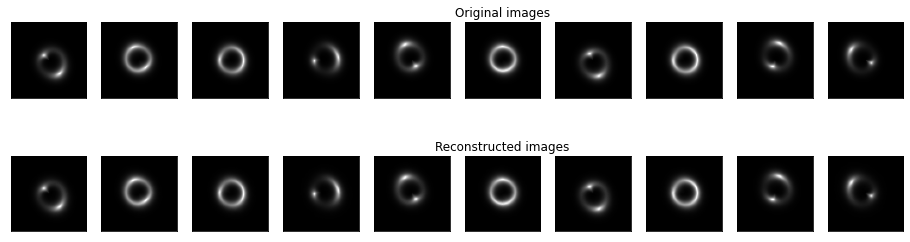

Epoch 282/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.381871442920357e-06, Val Recon loss: 3.680034448431494e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 283/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.138248876983048e-06, Val Recon loss: 3.6239042502630682e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 284/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.991939389887276e-06, Val Recon loss: 3.2268045641911967e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 285/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.353830794477782e-06, Val Recon loss: 2.9892337099429115e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

New lower val loss. Saving model checkpoint!
Epoch 286/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.080017706883138e-06, Val Recon loss: 3.945085205082756e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



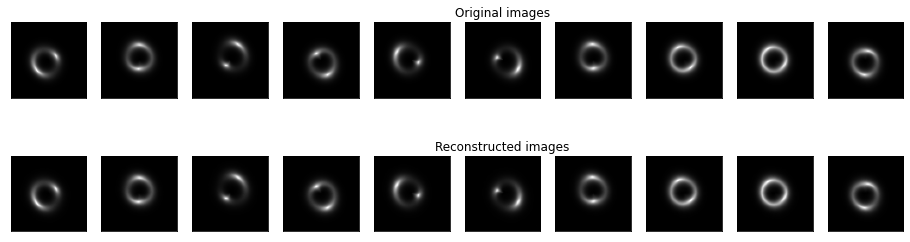

Epoch 287/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.830871938157735e-06, Val Recon loss: 4.4864734465793135e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 288/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.680158040609367e-06, Val Recon loss: 4.252233793522464e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 289/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.4568264057684625e-06, Val Recon loss: 5.919733009957579e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 290/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.5616247559416455e-06, Val Recon loss: 3.204258948446497e-06, 
 Disc loss: 0.0497567243874073, Gen loss: 27.599605560302734

Epoch 291/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.140720107591574e-06, Val Recon loss: 4.507869258911039e-06, 
 Disc loss: 0.008123650215566158, Gen loss: 27.62948989868164



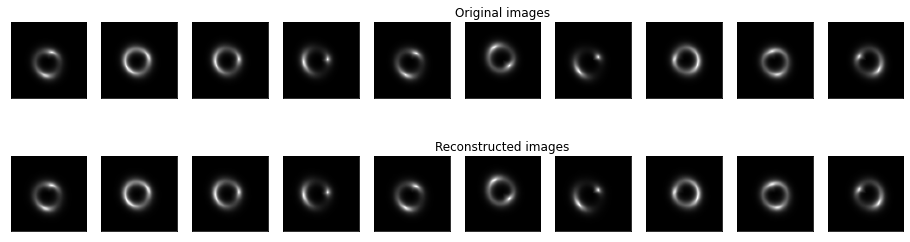

Epoch 292/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.029549411994378e-06, Val Recon loss: 3.173435364563678e-06, 
 Disc loss: 0.003970384132117033, Gen loss: 27.627063751220703

Epoch 293/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.993818281989795e-06, Val Recon loss: 3.6905837532685837e-06, 
 Disc loss: 0.0009902172023430467, Gen loss: 27.631025314331055

Epoch 294/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.692110698643715e-06, Val Recon loss: 4.2472317747726465e-06, 
 Disc loss: 0.0009902140591293573, Gen loss: 27.631025314331055

Epoch 295/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.558064659315144e-06, Val Recon loss: 3.191565888806104e-06, 
 Disc loss: 0.0009902172023430467, Gen loss: 27.631025314331055

Epoch 296/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.457977066153752e-06, Val Recon loss: 3.80255402079557e-06, 
 Disc loss: 0.0009902172023430467, Gen loss: 27.631025314331055



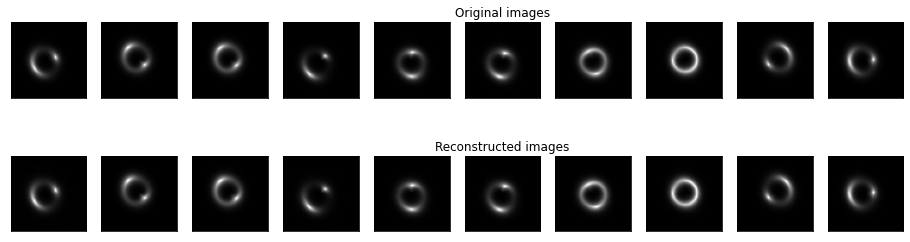

Epoch 297/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.412179731625589e-06, Val Recon loss: 5.5000540568370425e-06, 
 Disc loss: 0.0033880644477903843, Gen loss: 27.630033493041992

Epoch 298/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.3617740083035135e-06, Val Recon loss: 5.959246765188355e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 299/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.749162908514253e-06, Val Recon loss: 3.146131929396587e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055

Epoch 300/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.504440339147583e-06, Val Recon loss: 4.1137915205682575e-06, 
 Disc loss: 0.0, Gen loss: 27.631025314331055



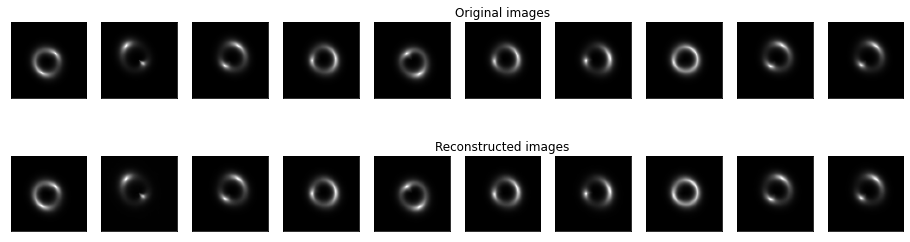

In [27]:
#Training and tracking model
model, loss_dict = fit_model(model, config, checkpoint_path = PATH)

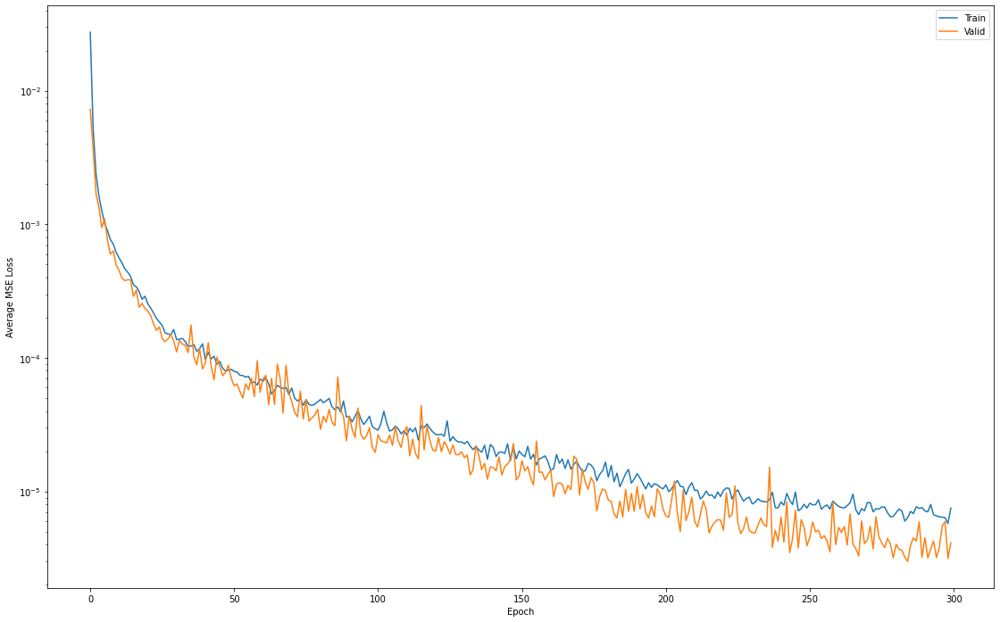

In [28]:
# Plot losses
plt.figure(figsize=(19,12))
plt.semilogy(loss_dict['train_rec_loss'], label='Train')
plt.semilogy(loss_dict['val_rec_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average MSE Loss')
#plt.grid()
plt.legend()
#plt.title('loss')


plot_name = "Recon_Loss_history"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"Train, Val MSE recon loss history")]})

plt.show()

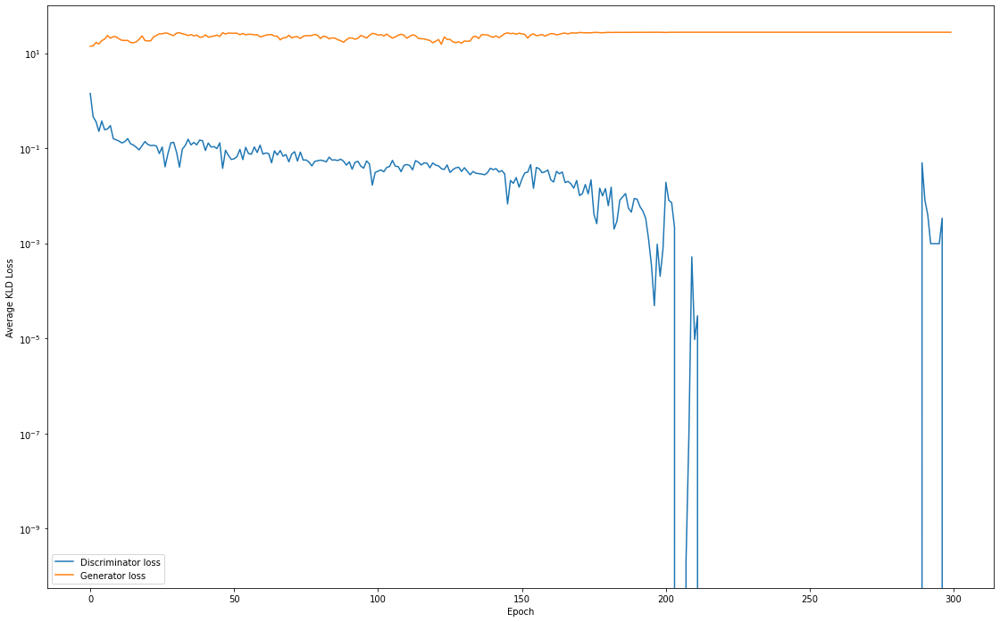

In [29]:
# Plot losses
plt.figure(figsize=(19,12))
plt.semilogy(loss_dict['disc_loss'], label='Discriminator loss')
plt.semilogy(loss_dict['gen_loss'], label='Generator loss')
plt.xlabel('Epoch')
plt.ylabel('Average KLD Loss')
#plt.grid()
plt.legend()
#plt.title('loss')


plot_name = "disc_vs_gen_loss_history"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"Disc vs Gen loss history")]})

plt.show()

In [30]:
del encoder, decoder, disc
gc.collect()

encoder = Encoder().to(device)
decoder = Decoder().to(device)
disc = Discriminator().to(device)

encoder.load_state_dict(torch.load(PATH + 'encoder.pth'))
decoder.load_state_dict(torch.load(PATH + 'decoder.pth'))
disc.load_state_dict(torch.load(PATH + 'discriminator.pth'))

model = {'enc':encoder,
        'dec': decoder,
        'disc': disc}

In [31]:
criterion = nn.MSELoss()

_, _, train_mse = test_epoch(model, train_loader, criterion)
print("Train set MSE:" + str(train_mse))

_, _, val_mse = test_epoch(model, val_loader, criterion)
print("Val set MSE:" + str(val_mse))

_, _, test_mse = test_epoch(model, test_loader, criterion)
print("Test set MSE:" + str(test_mse))

  0%|          | 0/109 [00:00<?, ?it/s]

Train set MSE:4.842701780427153e-06


  0%|          | 0/9 [00:00<?, ?it/s]

Val set MSE:2.9892337099429115e-06


  0%|          | 0/20 [00:00<?, ?it/s]

Test set MSE:3.0012449656169336e-06


In [32]:
MSE_scores = [[train_mse, val_mse, test_mse]]

wandb.log({"MSE_Scores": wandb.Table(data = MSE_scores, columns=["Train_MSE", "Val_MSE", "Test_MSE"])})

## Model Testing for Anomaly Detection

In [33]:
def img_paths_list(root_dir):
    root_list = glob.glob(root_dir)
    class_map = {}
    class_distribution = {}
    
    for img_path in root_list:
        class_name = img_path.split(os.sep)[-2]
        if class_name not in class_distribution:
            class_distribution[class_name] = 1
        else:
            class_distribution[class_name] +=1
                
    for index, entity in enumerate(class_distribution):
        class_map[entity] = index
    print("Dataset Distribution:\n")
    print(class_distribution)
    print("\n\nClass indices:\n")
    print(class_map)

    data = []
    for img_path in tqdm(root_list):
        class_name = img_path.split(os.sep)[-2]
        data.append([img_path, class_name])
        
    return data, class_map

In [34]:
class CustomDataset(Dataset):
    def __init__(self, img_paths_and_labels_list, class_map,transform = None):
        self.data = img_paths_and_labels_list
        self.class_map = class_map
        self.transform = transform
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        img_path, class_name = self.data[idx]
        img = np.load(img_path, allow_pickle = True)
        if class_name == 'axion':
            img = img[0]
        img = (img - np.min(img))/(np.max(img) - np.min(img))
        
        if self.transform:
            aug = self.transform(image=img)
            img = aug['image']
        
        img = img.to(torch.float)
        class_id = self.class_map[class_name]
        class_id = torch.tensor(class_id)

        return img, class_id

In [35]:
full_test_data_root_dir = r'../input/gsocml4scimodel3test/Model_III_test/*/*'
full_test_dataset_img_paths_list, class_map = img_paths_list(full_test_data_root_dir)

Dataset Distribution:

{'axion': 5000, 'no_sub': 5000, 'cdm': 5000}


Class indices:

{'axion': 0, 'no_sub': 1, 'cdm': 2}


  0%|          | 0/15000 [00:00<?, ?it/s]

In [36]:
full_test_dataset = CustomDataset(full_test_dataset_img_paths_list, class_map, transform = test_transforms)
print(len(full_test_dataset))

15000


In [37]:
full_test_loader = DataLoader(full_test_dataset, batch_size = config["batch_size"], shuffle = False, num_workers = 2)
single_batch = next(iter(test_loader))
single_batch[0].shape

torch.Size([1, 64, 64])

In [38]:
def final_test_epoch(model, dataloader,criterion):

    encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
   
    encoder.eval()
    decoder.eval()
    disc.eval()
    
    losses = []
    
    truth_list = []

    with torch.no_grad():

        loop=tqdm(enumerate(dataloader),total=len(dataloader))
        
        for batch_idx, (img_batch, class_ids) in loop:
            
            for img, class_id in zip(img_batch,class_ids):
                
                if class_id == class_map['no_sub']:
                    truth_list.append(0)
                else:
                    truth_list.append(1)
                    
                img = img.unsqueeze(0)
                X = img.to(device)
                
                encoded_space = encoder(X)
                recon = decoder(encoded_space)
                
                loss = criterion(recon, X).item()
                losses.append(loss)
                   

    return np.asarray(losses), np.asarray(truth_list), np.mean(losses)

In [39]:
criterion = nn.MSELoss()
loss_list, truth_list, mean_loss = final_test_epoch(model, full_test_loader,criterion)
print(mean_loss)

  0%|          | 0/59 [00:00<?, ?it/s]

0.00011467285796456963


In [40]:
fpr, tpr, thresholds = roc_curve(truth_list, loss_list)
roc_auc = auc(fpr, tpr)

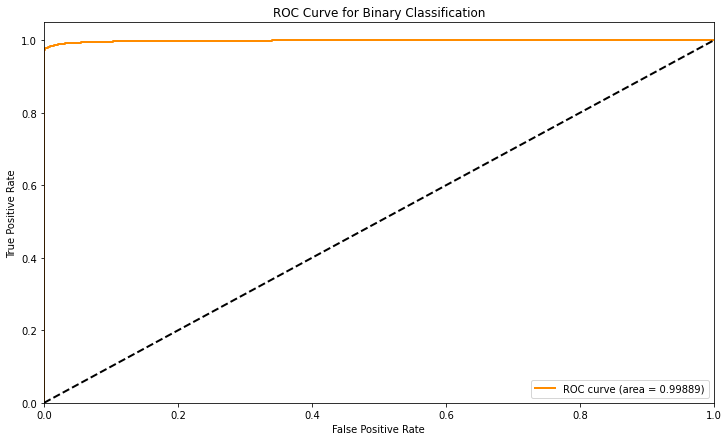

In [41]:
# Plot the AUC
plt.figure(figsize = (12, 7))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.5f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Binary Classification')
plt.legend(loc="lower right", prop={"size":10})

plot_name = "ROC-AUC"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"ROC-AUC curve")]})

plt.show()

In [42]:
wandb.finish()

disc_loss,▆█▄▄▂▄▃▃▂▃▂▃▂▂▂▂▂▂▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_loss,▁▄▂▆█▅▇▆▆▅▆▄▄▇▆▄▅▂▅▇▆▆▇█████████████████
train_rec_loss,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_rec_loss,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
disc_loss,0.0
epoch,300
gen_loss,27.63103
train_rec_loss,1e-05
val_rec_loss,0.0
